## **Heart Disease Statistics**

**Heart disease remains the leading cause of death in the U.S.,** accounting for approximately **702,880 deaths in 2022** ([CDC Heart Disease Stats](https://www.cdc.gov/heart-disease/data-research/facts-stats/index.html?utm_source=chatgpt.com)).

#### **Heart Attack Symptoms:**
- **Common Symptoms**:
  - Chest discomfort or pain
  - Pain in the shoulders, neck, jaw, arms, or back
  - Shortness of breath
  - Lightheadedness or nausea
- **Less Common Symptoms**:
  - Unusual fatigue
  - Dizziness
  - Cold sweat

#### **Heart Attack Risk Factors:**
- **Women vs. Men**:
  - **Women**: May feel discomfort like pressure, squeezing, or pain in the center of the chest, pain in the arms, back, neck, or stomach, shortness of breath, and nausea.
  - **Men**: Typically feel chest pain, pain in the arms, neck, back, or jaw, along with shortness of breath, sweating, and heartburn-like discomfort.

**The human heart beats around 100,000 times daily, pumping 2,000 gallons of blood through approximately 60,000 miles of blood vessels.**

> Source: [healthblog.uofmhealth](https://healthblog.uofmhealth.org)

---

## **Heart Disease in the U.S.**

Heart disease, which includes coronary heart disease, hypertension, and stroke, is the **#1 cause of death** in the U.S. As per the **American Heart Association's 2024 Heart Disease and Stroke Statistics Update**:

- **116.4 million** adults in the U.S. (46% of the population) have **hypertension**.
- **Cardiovascular disease (CVD)** causes one death every **38 seconds** (2,303 deaths per day).
- **Stroke** causes one death every **3.7 minutes** (389 deaths per day).

For further details, visit the [American Heart Association's 2024 Heart Disease and Stroke Statistics](https://www.heart.org/-/media/PHD-Files-2/Science-News/2/2024-Heart-and-Stroke-Stat-Update/2024-Statistics-At-A-Glance-final_2024.pdf?utm_source=chatgpt.com).


---

## **About the Data**

This dataset contains medical information about patients with and without heart disease. The goal is to identify patterns and relationships between various health metrics and the presence of heart disease. The dataset includes both numerical and categorical variables representing patient demographics, physical health indicators, and diagnostic results.

### **Dataset Features:**
- **age**: Age of the patient (in years)
- **sex**: Gender of the patient (1 = Male, 0 = Female)
- **chest_pain_type**: Type of chest pain experienced  
  - 0: Typical Angina  
  - 1: Atypical Angina  
  - 2: Non-Anginal Pain  
  - 3: Asymptomatic
- **resting_blood_pressure**: Resting blood pressure (in mm Hg)
- **cholesterol**: Serum cholesterol level (in mg/dl)
- **fasting_blood_sugar**: Fasting blood sugar > 120 mg/dl (1 = True, 0 = False)
- **resting_ecg**: Resting electrocardiographic results  
  - 0: Normal  
  - 1: ST-T wave abnormality  
  - 2: Left ventricular hypertrophy
- **max_heart_rate**: Maximum heart rate achieved during exercise
- **exercise_induced_angina**: Exercise-induced chest pain (1 = Yes, 0 = No)
- **oldpeak**: Depression induced by exercise relative to rest
- **st_slope**: Slope of the ST segment  
  - 0: Upsloping  
  - 1: Flat  
  - 2: Downsloping
- **target**: Presence of heart disease (1 = Heart disease, 0 = No heart disease)

---

In [1]:
# Importing required modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# For converting large numbers to human readable format
from numerize.numerize import numerize

In [2]:
# Setting the default values for the the figure size and dpi level
plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["figure.dpi"] = 300

# Setting the default size of plot title and labels
plt.rcParams["figure.titlesize"] = 15
plt.rcParams["axes.labelsize"] = 12

# Setting the default weight of plot title and labels
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'

# Setting to display all columns of DF
pd.set_option('display.max_columns', None)

In [3]:
# Reading data from the file: 'heart_disease_dataset_final.csv'
df = pd.read_csv("./Data/heart_disease_dataset_final.csv")
df.head()

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0


In [4]:
# Checking the statistics of the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,1190.0,53.720168,9.358203,28.0,47.0,54.0,60.00,77.0
sex,1190.0,0.763866,0.424884,0.0,1.0,1.0,1.00,1.0
chest pain type,1190.0,3.232773,0.935480,1.0,3.0,4.0,4.00,4.0
resting bp s,1190.0,132.153782,18.368823,0.0,120.0,130.0,140.00,200.0
cholesterol,1190.0,210.363866,101.420489,0.0,188.0,229.0,269.75,603.0
fasting blood sugar,1190.0,0.213445,0.409912,0.0,0.0,0.0,0.00,1.0
resting ecg,1190.0,0.698319,0.870359,0.0,0.0,0.0,2.00,2.0
max heart rate,1190.0,139.732773,25.517636,60.0,121.0,140.5,160.00,202.0
exercise angina,1190.0,0.387395,0.487360,0.0,0.0,0.0,1.00,1.0
oldpeak,1190.0,0.922773,1.086337,-2.6,0.0,0.6,1.60,6.2


In [5]:
# Checking the datatypes of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  1190 non-null   int64  
 1   sex                  1190 non-null   int64  
 2   chest pain type      1190 non-null   int64  
 3   resting bp s         1190 non-null   int64  
 4   cholesterol          1190 non-null   int64  
 5   fasting blood sugar  1190 non-null   int64  
 6   resting ecg          1190 non-null   int64  
 7   max heart rate       1190 non-null   int64  
 8   exercise angina      1190 non-null   int64  
 9   oldpeak              1190 non-null   float64
 10  ST slope             1190 non-null   int64  
 11  target               1190 non-null   int64  
dtypes: float64(1), int64(11)
memory usage: 111.7 KB


In [6]:
# Checking if we have any null values in the dataset
df.isnull().sum()

age                    0
sex                    0
chest pain type        0
resting bp s           0
cholesterol            0
fasting blood sugar    0
resting ecg            0
max heart rate         0
exercise angina        0
oldpeak                0
ST slope               0
target                 0
dtype: int64

In [7]:
# Renaming columns
df.columns = [
    'age', 'sex', 'chest_pain_type', 'resting_blood_pressure', 'cholesterol', 'fasting_blood_sugar', 
    'resting_ecg', 'max_heart_rate', 'exercise_induced_angina', 'oldpeak', 'st_slope', 'target'
]

df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0


---

## **Explanatory Data Analysis**

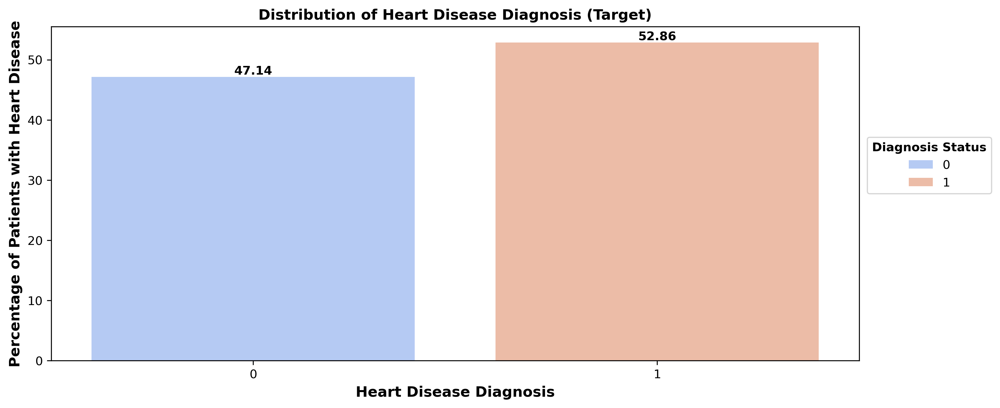

In [8]:
# Checking what is the distribution of patients with and without heart disease in the dataset
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'target',
    hue = 'target',
    palette = 'coolwarm'
)

# Annotating bars
for bar in ax.patches:
    if bar.get_height() > 0:
        ax.annotate(
            round(bar.get_height(), 2),
            (bar.get_x() + bar.get_width()/2, bar.get_height()), 
            ha = 'center', va = 'bottom', fontweight = 'bold'
        )

# Adding title and labels to the plot
plt.title("Distribution of Heart Disease Diagnosis (Target)")
plt.xlabel("Heart Disease Diagnosis")
plt.ylabel("Percentage of Patients with Heart Disease")

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

In [9]:
# Creating a utility function for annotating bars
def annotate_bars(ax, decimal = True):
    """
    Function for adding annotation to the bars.

    Parameters:
    - ax: The axis object of the plot.
    - decimal: To specify whether to show the values with decimal point or not.
    """

    # Looping through each bar
    for bar in ax.patches:
        
        # Checking the height of the bar
        if bar.get_height() > 0 and decimal:
            
            # Adding annotation
            ax.annotate(
                numerize(bar.get_height()),
                (bar.get_x() + bar.get_width()/2, bar.get_height()), 
                ha = 'center', va = 'bottom', fontweight = 'bold'
            )
        
        elif bar.get_height() > 0 and not decimal:
            
            # Rounding up the value
            value = numerize(bar.get_height())
            if bar.get_height() > 1000:
                value = f"{round(float(value[:-1]))}{value[-1]}"
            else:
                value = f"{round(float(value))}"
            
            # Adding annotation
            ax.annotate(
                value,
                (bar.get_x() + bar.get_width()/2, bar.get_height()), 
                ha = 'center', va = 'bottom', fontweight = 'bold'
            )
    

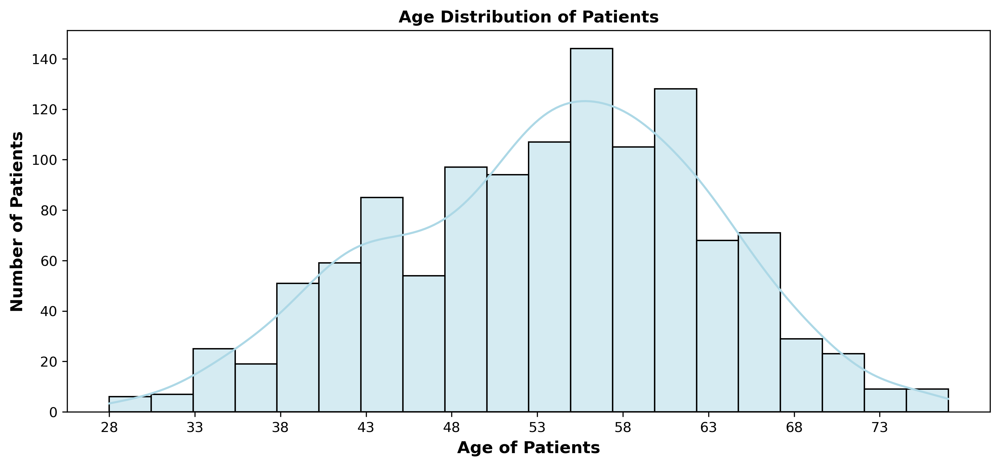

In [10]:
# Checking what is the age distribution of patients in the dataset
sns.histplot(
    data = df,
    x = 'age',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Age Distribution of Patients")
plt.xlabel("Age of Patients")
plt.ylabel("Number of Patients")

# Changing the xtick values
min_value = df['age'].min()
max_value = df['age'].max()
plt.xticks(range(min_value, max_value, 5));

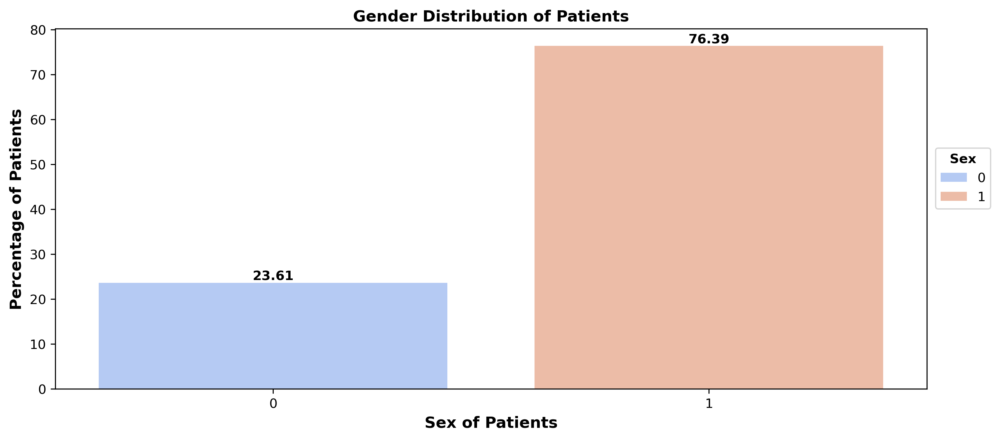

In [11]:
# Checking the distribution of patients' sex
ax = sns.countplot(
    data = df,
    x = 'sex',
    stat = 'percent',
    hue = 'sex',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Gender Distribution of Patients")
plt.xlabel("Sex of Patients")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Sex", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

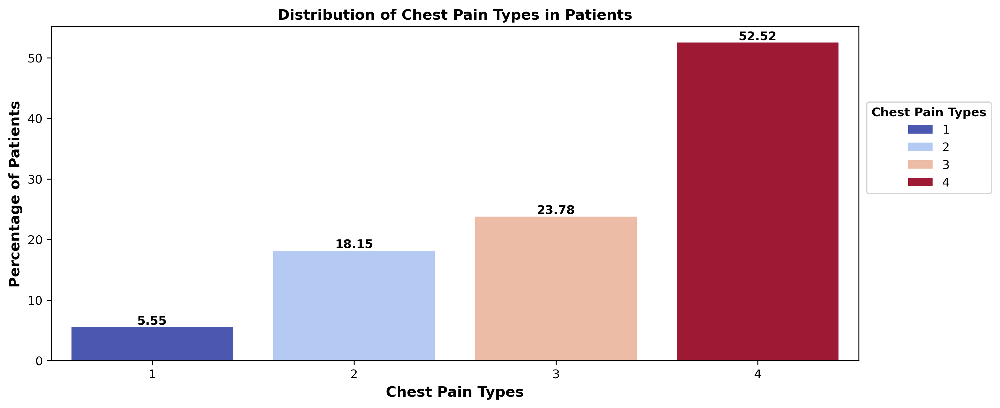

In [12]:
# Checking the distribution of chest pain types
ax = sns.countplot(
    data = df,
    stat = "percent",
    x = 'chest_pain_type',
    hue = 'chest_pain_type',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Chest Pain Types in Patients")
plt.xlabel("Chest Pain Types")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Chest Pain Types", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

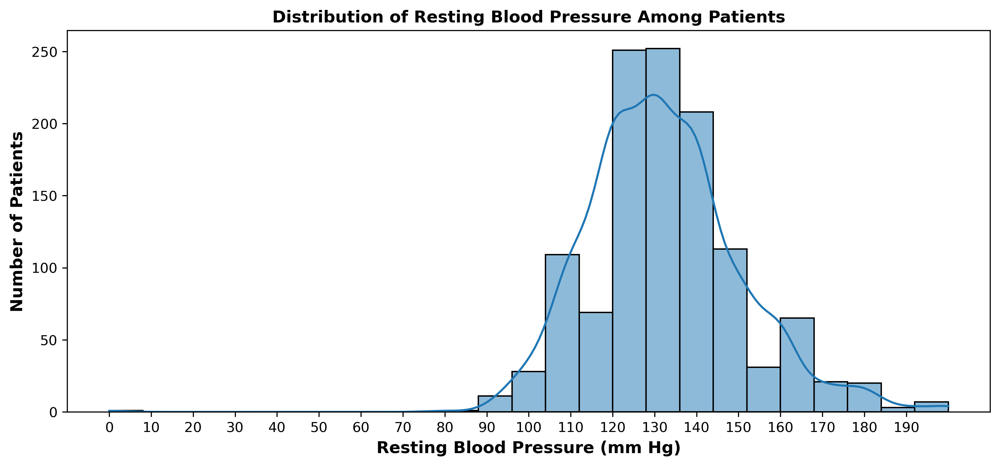

In [13]:
# Checking the distribution of resting blood pressure
sns.histplot(
    data = df,
    x = 'resting_blood_pressure',
    bins = 25,
    kde = True
)

# Adding title and labels to the plot
plt.title("Distribution of Resting Blood Pressure Among Patients")
plt.xlabel("Resting Blood Pressure (mm Hg)")
plt.ylabel("Number of Patients")

# Changing the xtick values
min_value = df['resting_blood_pressure'].min()
max_value = df['resting_blood_pressure'].max()
plt.xticks(range(min_value, max_value, 10));

In [14]:
# Filtering individuals with resting blood pressure less than 80
df[df['resting_blood_pressure'] < 80]

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target
450,55,1,3,0,0,0,0,155,0,1.5,2,1


In [15]:
# Dropping the patients that have resting blood pressure less than 80
df = df.drop(df[df['resting_blood_pressure'] < 80].index)
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0


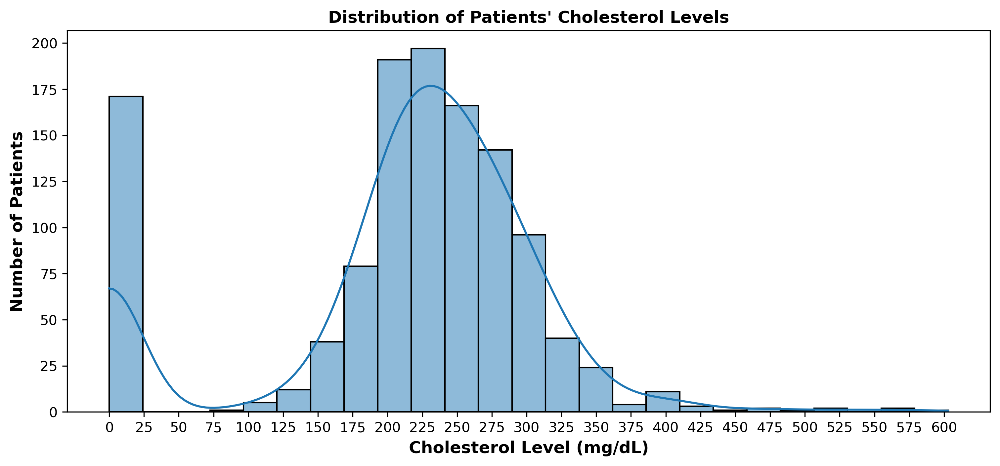

In [16]:
# Checking the distribution of cholesterol levels in the patients
sns.histplot(
    data = df,
    x = 'cholesterol',
    bins = 25,
    kde = True
)

# Adding title and labels to the plot
plt.title("Distribution of Patients' Cholesterol Levels")
plt.xlabel("Cholesterol Level (mg/dL)")
plt.ylabel("Number of Patients")

# Changing the xtick values
min_value = int(df['cholesterol'].min())
max_value = int(df['cholesterol'].max())
plt.xticks(range(min_value, max_value, 25));


In [17]:
# Filtering individuals with choleterol level less than 75
df[df['cholesterol'] < 75]

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target
294,65,1,4,115,0,0,0,93,1,0.0,2,1
295,32,1,1,95,0,1,0,127,0,0.7,1,1
296,61,1,4,105,0,1,0,110,1,1.5,1,1
297,50,1,4,145,0,1,0,139,1,0.7,2,1
298,57,1,4,110,0,1,1,131,1,1.4,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
515,43,1,4,122,0,0,0,120,0,0.5,1,1
516,63,1,3,130,0,1,1,160,0,3.0,2,0
519,48,1,3,102,0,1,1,110,1,1.0,3,1
536,56,1,4,130,0,0,2,122,1,1.0,2,1


In [18]:
# Dropping the patients that have cholesterol level equal to 0
df = df.drop(df[df['cholesterol'] == 0].index)
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0


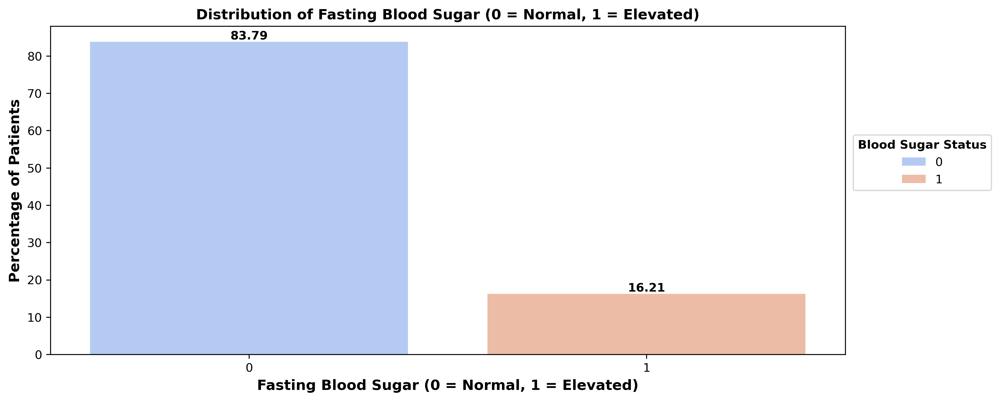

In [19]:
# Checking the distribution of fasting blood sugar levels (normal vs. elevated) among patients.
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'fasting_blood_sugar',
    hue = 'fasting_blood_sugar',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Fasting Blood Sugar (0 = Normal, 1 = Elevated)")
plt.xlabel("Fasting Blood Sugar (0 = Normal, 1 = Elevated)")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Blood Sugar Status", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

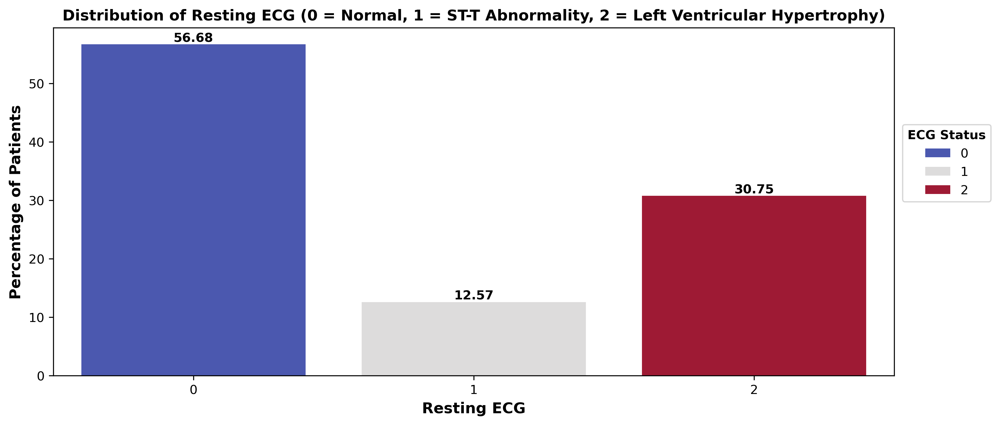

In [20]:
# Checking the distribution of patients based on their resting ECG results (normal, ST-T wave abnormality, left ventricular hypertrophy)
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'resting_ecg',
    hue = 'resting_ecg',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Resting ECG (0 = Normal, 1 = ST-T Abnormality, 2 = Left Ventricular Hypertrophy)")
plt.xlabel("Resting ECG")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "ECG Status", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

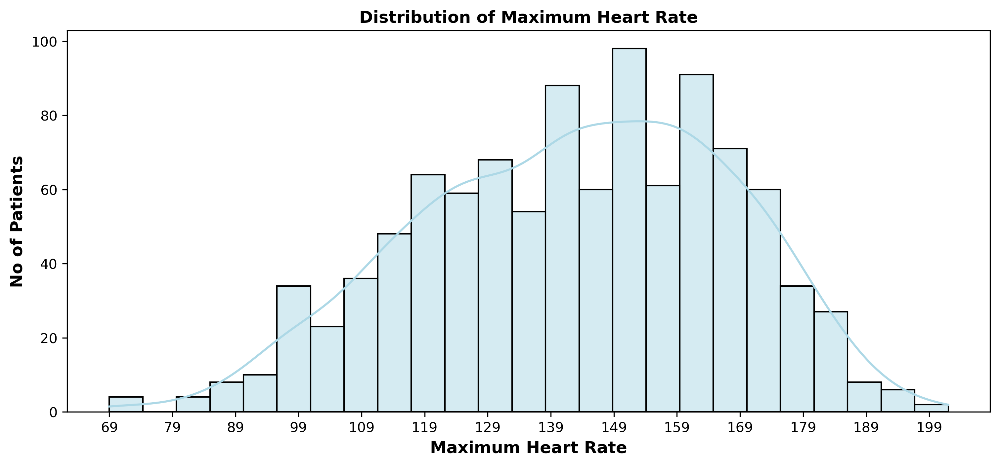

In [21]:
# Checking the distribution of maximum heart rate achieved during exercise by patients
sns.histplot(
    data = df,
    x = 'max_heart_rate',
    bins = 25,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Maximum Heart Rate")
plt.xlabel("Maximum Heart Rate")
plt.ylabel("No of Patients")

# Changing the xtick values
min_value = int(df['max_heart_rate'].min())
max_value = int(df['max_heart_rate'].max())
plt.xticks(range(min_value, max_value, 10));

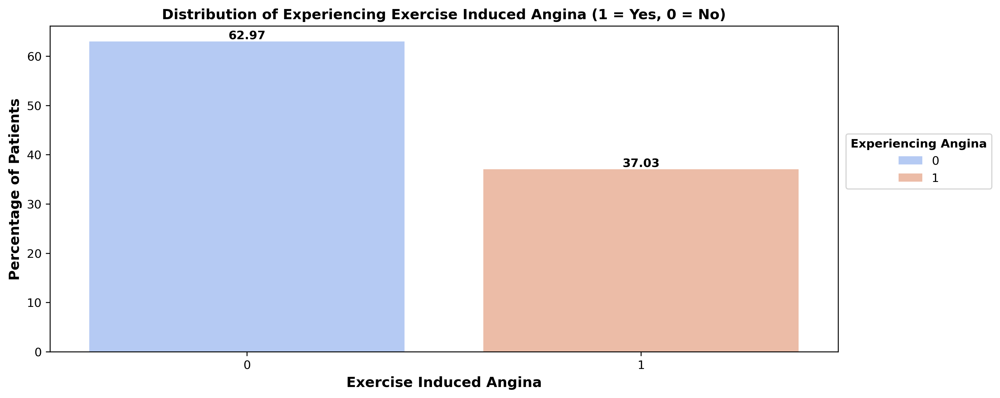

In [22]:
# Checking the percentage of individuals who experience angina (chest pain) due to exercise.
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'exercise_induced_angina',
    hue = 'exercise_induced_angina',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Experiencing Exercise Induced Angina (1 = Yes, 0 = No)")
plt.xlabel("Exercise Induced Angina")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Experiencing Angina", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

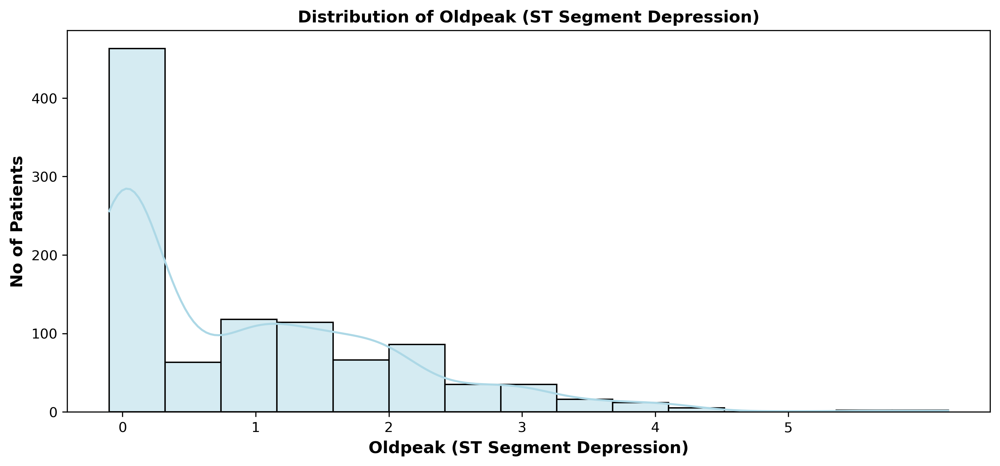

In [23]:
# Checking the distribution of Oldpeak values, which measure the depression of the ST segment during exercise,
sns.histplot(
    data = df,
    x = 'oldpeak',
    bins = 15,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Oldpeak (ST Segment Depression)")
plt.xlabel("Oldpeak (ST Segment Depression)")
plt.ylabel("No of Patients")

# Changing the xtick values
min_value = int(df['oldpeak'].min())
max_value = int(df['oldpeak'].max())
plt.xticks(range(min_value, max_value, 1));

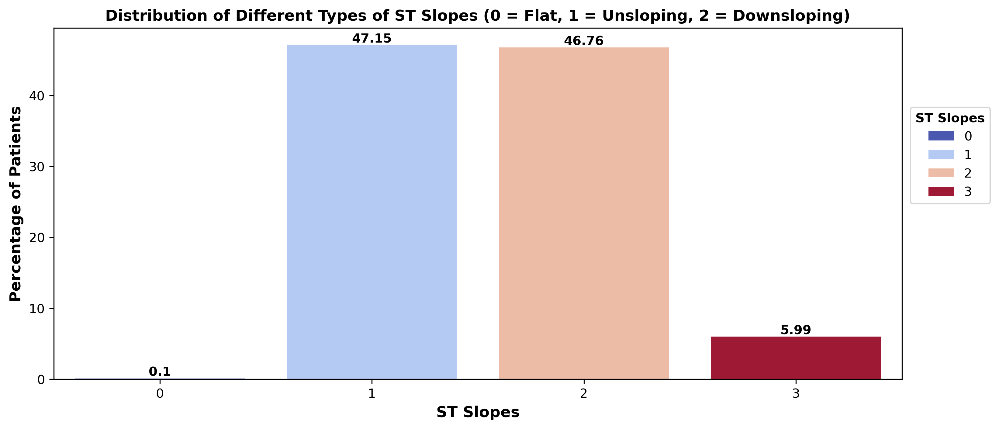

In [24]:
# Checking the distribution of patients with different types of ST slopes
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'st_slope',
    hue = 'st_slope',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Different Types of ST Slopes (0 = Flat, 1 = Unsloping, 2 = Downsloping)")
plt.xlabel("ST Slopes")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "ST Slopes", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

In [26]:
# Checking the odds of getting a heart attack based on sex
males_with_heart_disease = len(df[(df['target'] == 1) & (df['sex'] == 1)])
males_without_heart_disease = len(df[(df['target'] == 0) & (df['sex'] == 1)])

females_with_heart_disease = len(df[(df['target'] == 1) & (df['sex'] == 0)])
females_without_heart_disease = len(df[(df['target'] == 0) & (df['sex'] == 0)])

# Calculating the odds ratio
odds_ratio = (males_with_heart_disease * females_without_heart_disease) / (males_without_heart_disease * females_with_heart_disease)
round(odds_ratio, 2)

4.41

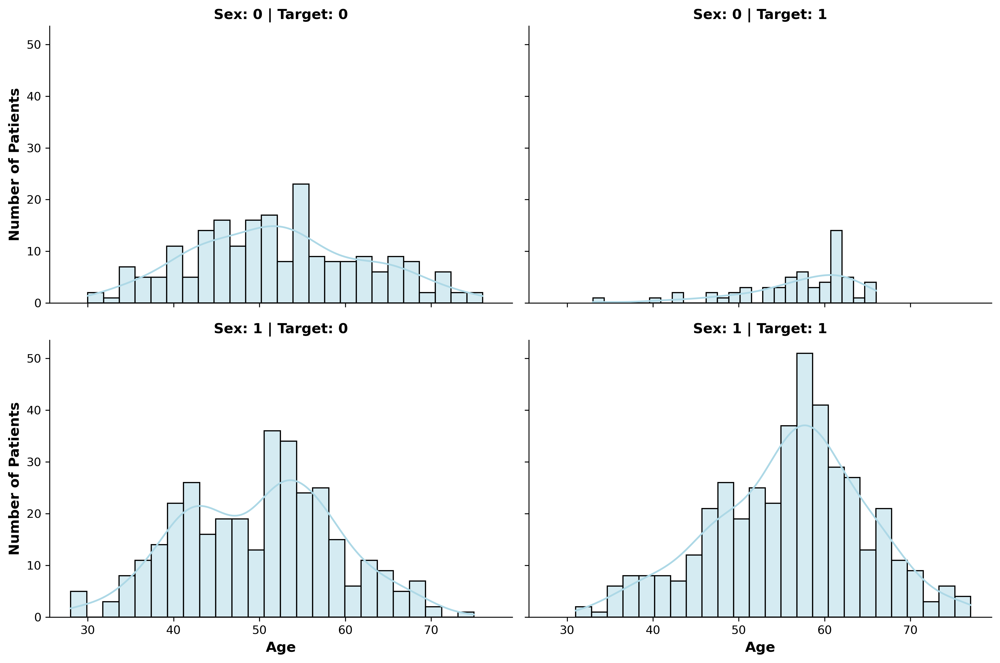

In [27]:
# Checking what is the distribution of heart disease across different age groups
g = sns.FacetGrid(
    data = df, 
    row="sex", 
    col="target", 
    height=4, 
    aspect=1.5
)

# Mapping the age distribution using histplot
g.map(sns.histplot, "age", bins = 25, kde=True, color='lightblue')

# Adding titles and labels to the plot
g.set_axis_labels("Age", "Number of Patients")
g.set_titles("Sex: {row_name} | Target: {col_name}");

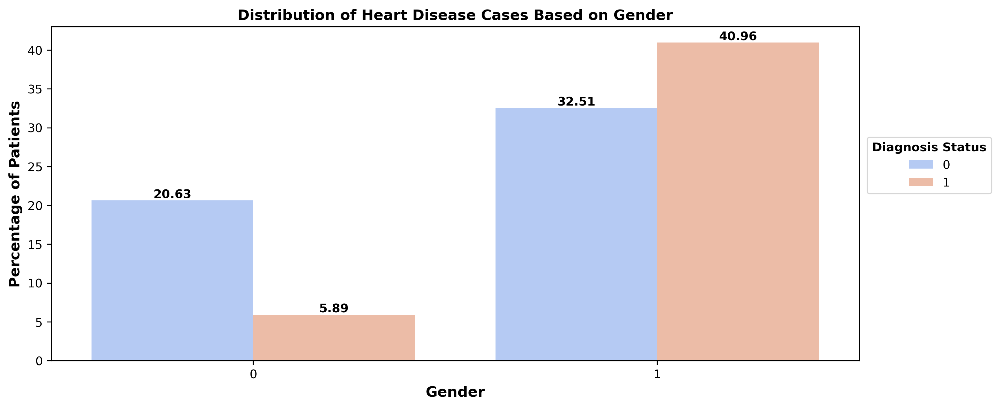

In [28]:
# Checking if there is a significant difference in heart disease cases between males and females
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'sex',
    hue = 'target',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Heart Disease Cases Based on Gender")
plt.xlabel("Gender")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties={'weight': 'bold'}, loc = (1.01, 0.5));

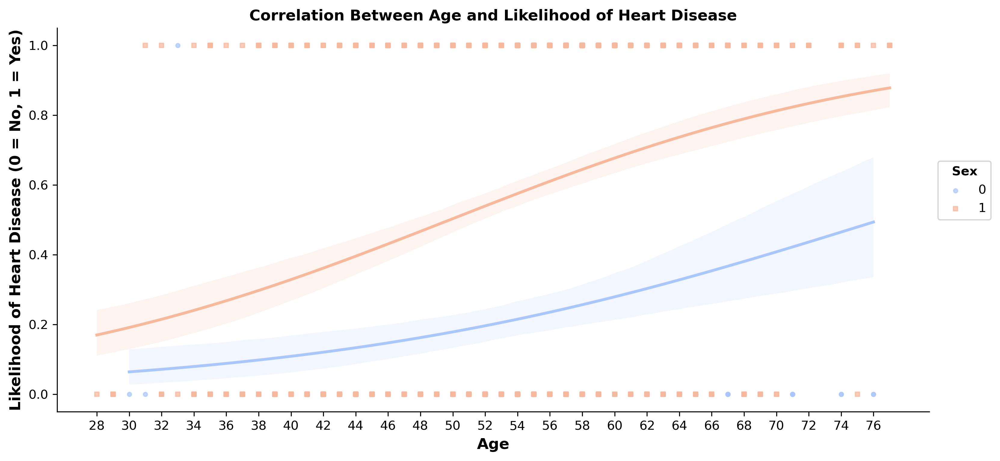

In [29]:
# Checking what is the correlation between age and the likelihood of having heart disease for different genders
sns.lmplot(
    data=df, 
    x="age", 
    y="target", 
    hue ="sex",
    logistic=True, 
    scatter_kws={'s': 10, 'alpha': 0.7}, 
    markers=["o", "s"], 
    palette="coolwarm",
    aspect=2.1,
    legend = False
)

# Adding titles and labels to the plot
plt.title("Correlation Between Age and Likelihood of Heart Disease")
plt.xlabel("Age")
plt.ylabel("Likelihood of Heart Disease (0 = No, 1 = Yes)")

# Changing the xtick values
min_value = int(df['age'].min())
max_value = int(df['age'].max())
plt.xticks(range(min_value, max_value, 2))

# Setting the location of the legend
plt.legend(title = "Sex", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

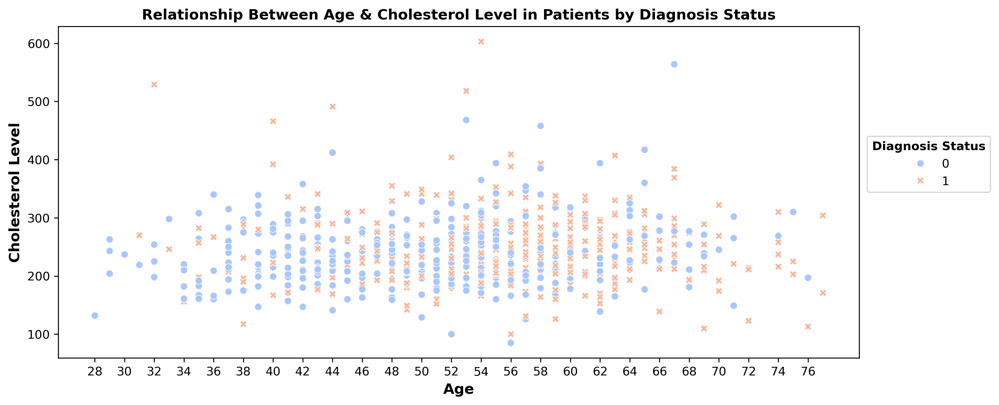

In [30]:
# Checking what is the relationship between age and cholesterol levels in patients with heart disease
sns.scatterplot(
    data = df,
    x = 'age',
    y = 'cholesterol',
    hue = 'target',
    palette = 'coolwarm',
    style = 'target'
)

# Adding titles and labels to the plot
plt.title("Relationship Between Age & Cholesterol Level in Patients by Diagnosis Status")
plt.xlabel("Age")
plt.ylabel("Cholesterol Level")

# Changing the xtick values
min_value = int(df['age'].min())
max_value = int(df['age'].max())
plt.xticks(range(min_value, max_value, 2))

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

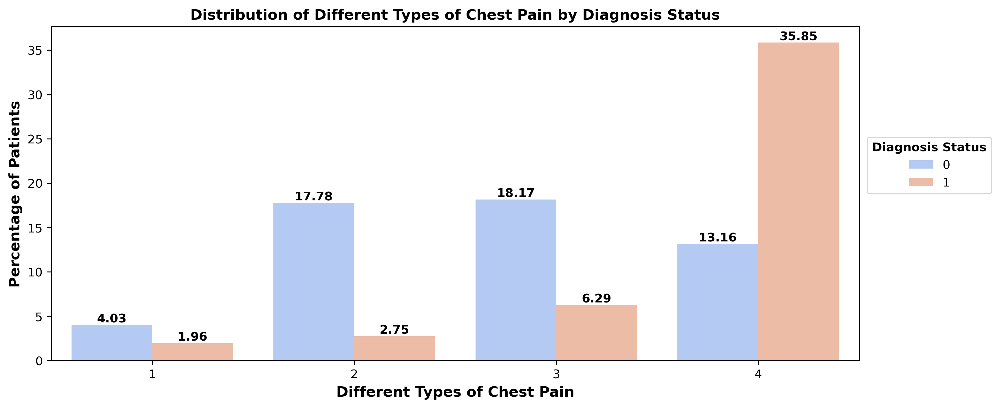

In [31]:
# Checking what is the distribution of different types of chest pain among heart disease patients
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'chest_pain_type',
    hue = 'target',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding titles and labels to the plot
plt.title("Distribution of Different Types of Chest Pain by Diagnosis Status")
plt.xlabel("Different Types of Chest Pain")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

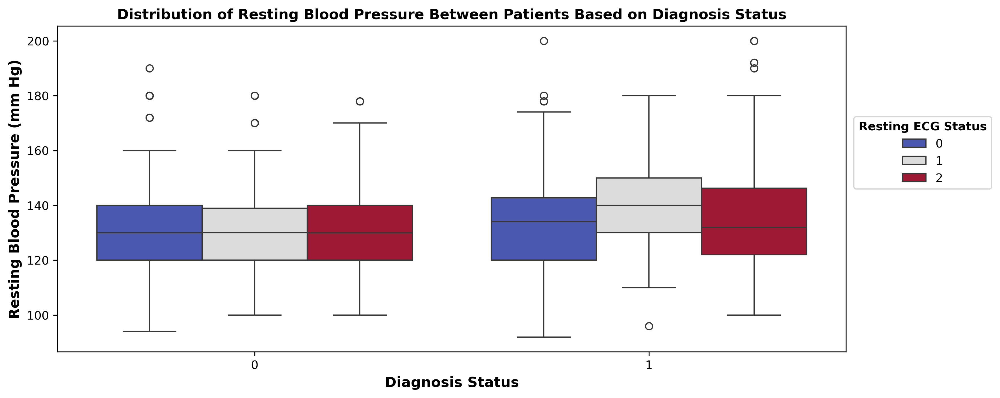

In [32]:
# Checking how does resting blood pressure vary between patients with and without heart disease
sns.boxplot(
    data = df,
    x = 'target',
    y = 'resting_blood_pressure',
    hue = 'resting_ecg',
    palette = 'coolwarm'
)

# Adding titles and labels to the plot
plt.title("Distribution of Resting Blood Pressure Between Patients Based on Diagnosis Status")
plt.xlabel("Diagnosis Status")
plt.ylabel("Resting Blood Pressure (mm Hg)")

# Setting the location of the legend
plt.legend(title = "Resting ECG Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

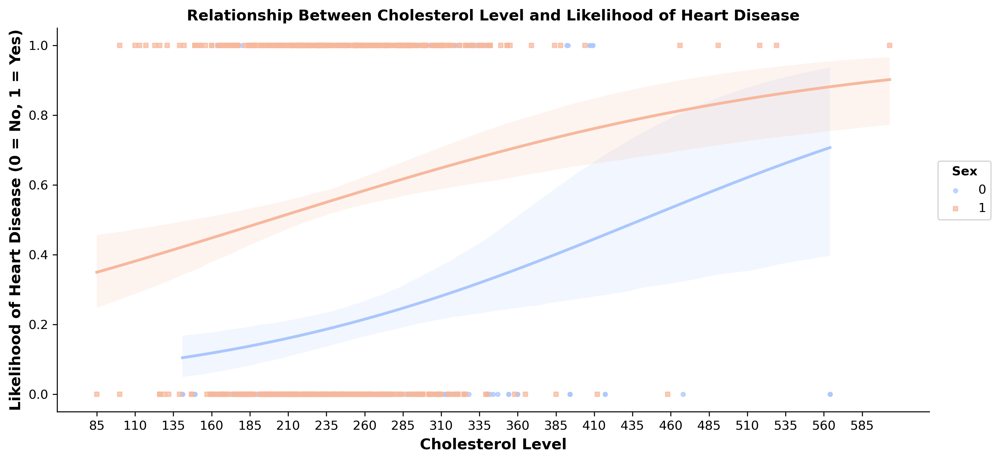

In [33]:
# Checking what is the relationship between cholesterol levels and the likelihood of having heart disease
sns.lmplot(
    data=df, 
    x="cholesterol", 
    y="target", 
    hue ="sex",
    logistic=True, 
    scatter_kws={'s': 10, 'alpha': 0.7}, 
    markers=["o", "s"], 
    palette="coolwarm",
    aspect=2.1,
    legend = False
)

# Adding titles and labels to the plot
plt.title("Relationship Between Cholesterol Level and Likelihood of Heart Disease")
plt.xlabel("Cholesterol Level")
plt.ylabel("Likelihood of Heart Disease (0 = No, 1 = Yes)")

# Changing the xtick values
min_value = int(df['cholesterol'].min())
max_value = int(df['cholesterol'].max())
plt.xticks(range(min_value, max_value, 25))

# Setting the location of the legend
plt.legend(title = "Sex", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

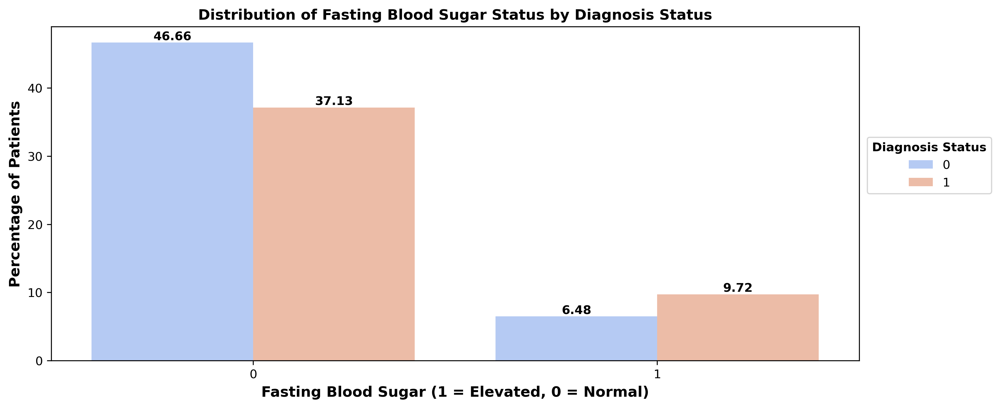

In [34]:
# Checking if fasting blood sugar play a role in predicting heart disease
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'fasting_blood_sugar',
    hue = 'target',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding titles and labels to the plot
plt.title("Distribution of Fasting Blood Sugar Status by Diagnosis Status")
plt.xlabel("Fasting Blood Sugar (1 = Elevated, 0 = Normal)")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

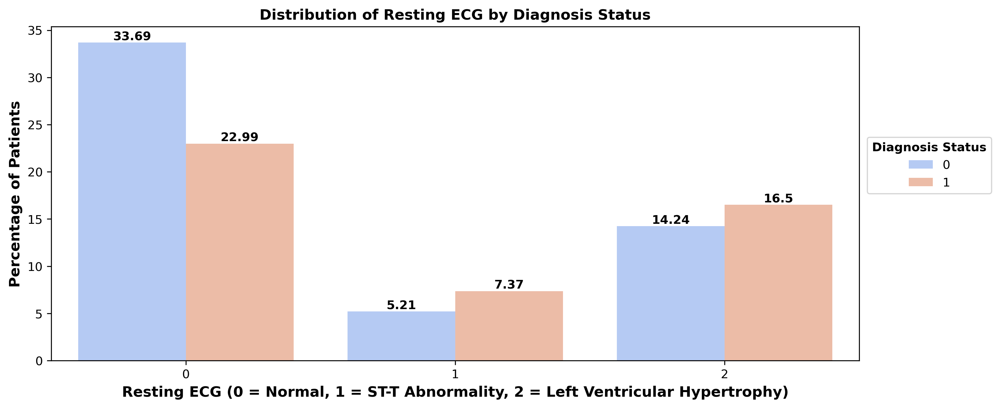

In [35]:
# Checking how do resting ECG results correlate with heart disease occurrence
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'resting_ecg',
    hue = 'target',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding titles and labels to the plot
plt.title("Distribution of Resting ECG by Diagnosis Status")
plt.xlabel("Resting ECG (0 = Normal, 1 = ST-T Abnormality, 2 = Left Ventricular Hypertrophy)")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

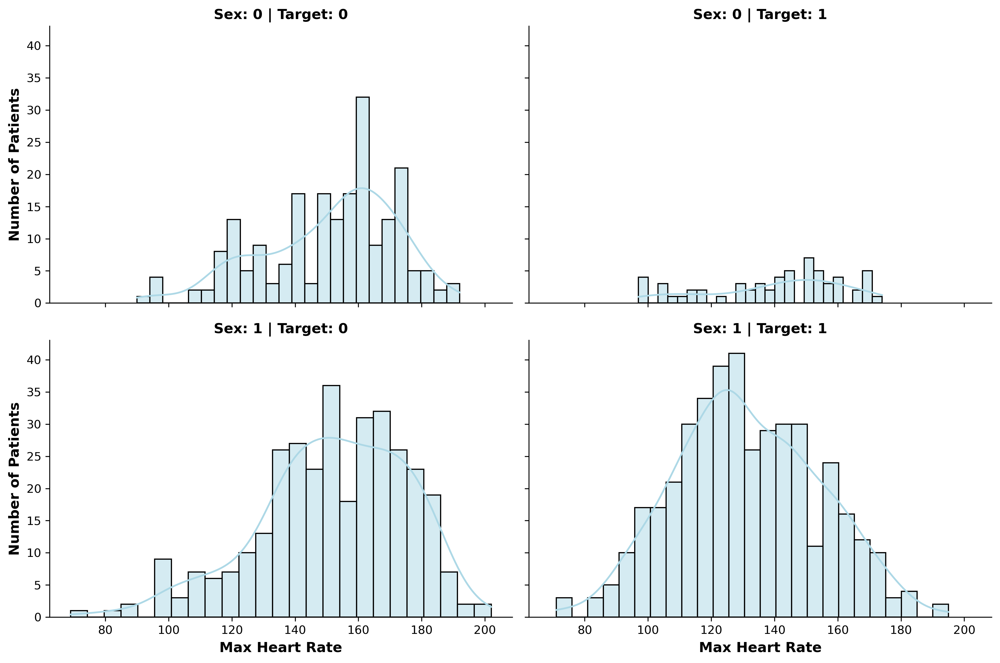

In [36]:
# Checking what is the distribution of maximum heart rate among heart disease patients
g = sns.FacetGrid(
    data = df, 
    row="sex", 
    col="target", 
    height=4, 
    aspect=1.5
)

# Mapping the age distribution using histplot
g.map(sns.histplot, "max_heart_rate", bins = 25, kde=True, color='lightblue')

# Adding titles and labels to the plot
g.set_axis_labels("Max Heart Rate", "Number of Patients")
g.set_titles("Sex: {row_name} | Target: {col_name}");

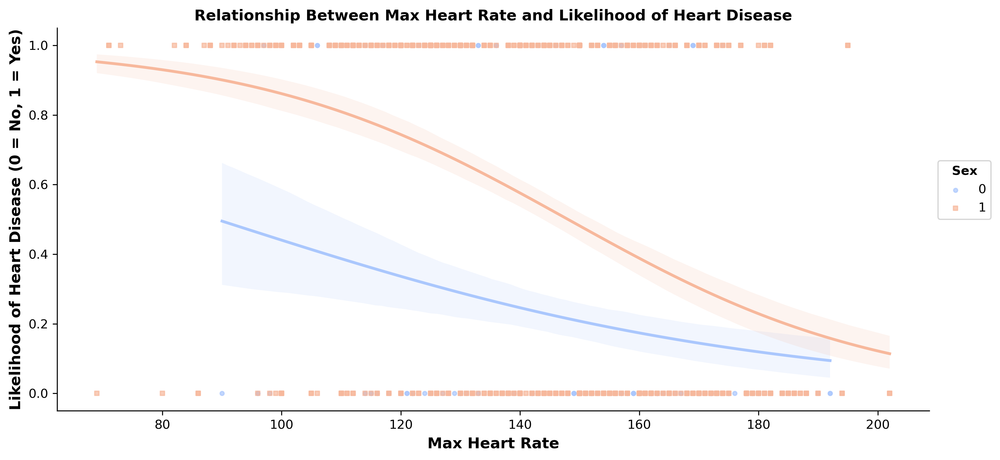

In [37]:
# Checking if there is any relationship between maximum heart rate and the likelihood of heart disease
sns.lmplot(
    data=df, 
    x="max_heart_rate", 
    y="target", 
    hue ="sex",
    logistic=True, 
    scatter_kws={'s': 10, 'alpha': 0.7}, 
    markers=["o", "s"], 
    palette="coolwarm",
    aspect=2.1,
    legend = False
)

# Adding titles and labels to the plot
plt.title("Relationship Between Max Heart Rate and Likelihood of Heart Disease")
plt.xlabel("Max Heart Rate")
plt.ylabel("Likelihood of Heart Disease (0 = No, 1 = Yes)")

# Setting the location of the legend
plt.legend(title = "Sex", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

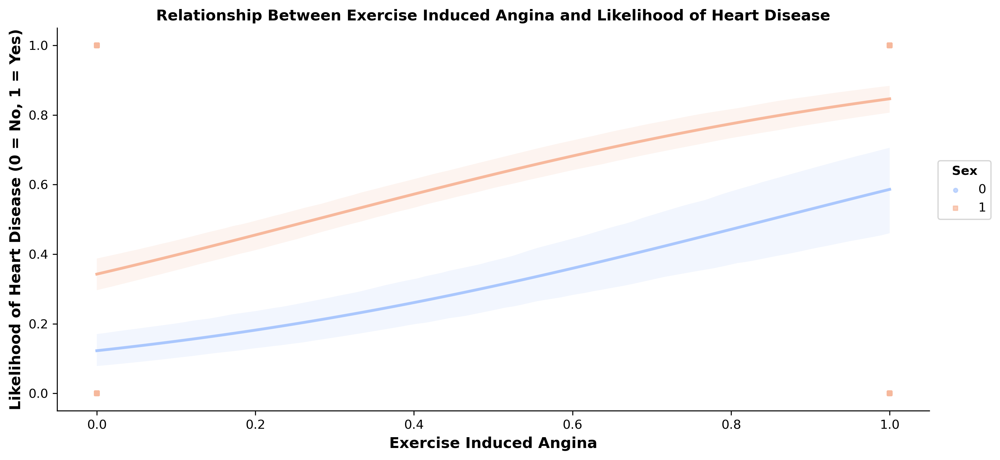

In [38]:
# Checking how does exercise-induced angina relate to the likelihood of having heart disease
sns.lmplot(
    data=df, 
    x="exercise_induced_angina", 
    y="target", 
    hue ="sex",
    logistic=True, 
    scatter_kws={'s': 10, 'alpha': 0.7}, 
    markers=["o", "s"], 
    palette="coolwarm",
    aspect=2.1,
    legend = False
)

# Adding titles and labels to the plot
plt.title("Relationship Between Exercise Induced Angina and Likelihood of Heart Disease")
plt.xlabel("Exercise Induced Angina")
plt.ylabel("Likelihood of Heart Disease (0 = No, 1 = Yes)")

# Setting the location of the legend
plt.legend(title = "Sex", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

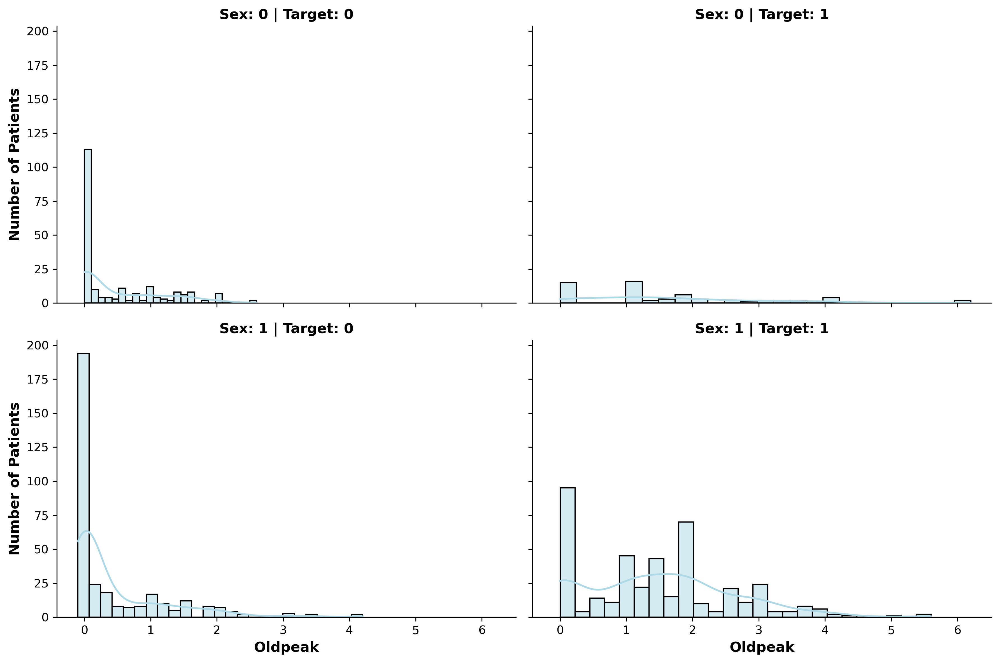

In [39]:
# Checking what is the distribution of oldpeak (ST segment depression) in patients with heart disease
g = sns.FacetGrid(
    data = df, 
    row="sex", 
    col="target", 
    height=4, 
    aspect=1.5
)

# Mapping the age distribution using histplot
g.map(sns.histplot, "oldpeak", bins = 25, kde=True, color='lightblue')

# Adding titles and labels to the plot
g.set_axis_labels("Oldpeak", "Number of Patients")
g.set_titles("Sex: {row_name} | Target: {col_name}");

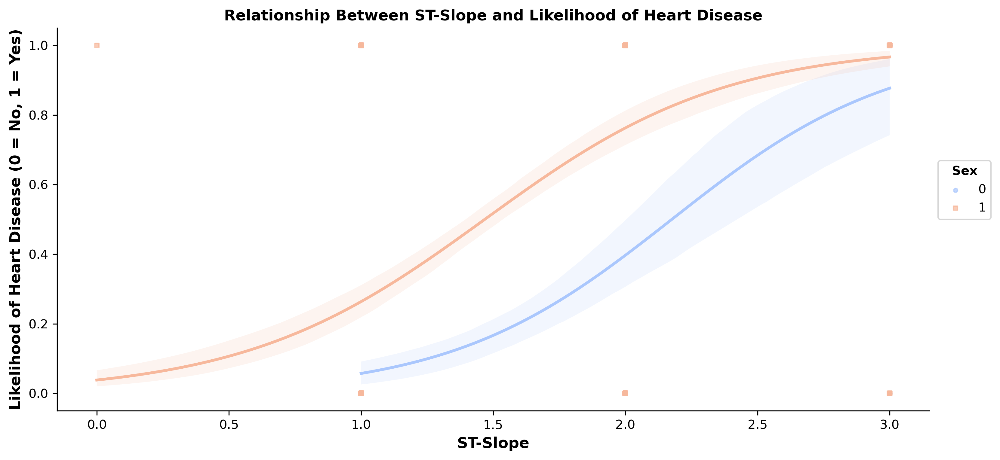

In [40]:
# Checking how does different types of ST slopes correlate with the likelihood of having heart disease
sns.lmplot(
    data=df, 
    x="st_slope", 
    y="target", 
    hue ="sex",
    logistic=True, 
    scatter_kws={'s': 10, 'alpha': 0.7}, 
    markers=["o", "s"], 
    palette="coolwarm",
    aspect=2.1,
    legend = False
)

# Adding titles and labels to the plot
plt.title("Relationship Between ST-Slope and Likelihood of Heart Disease")
plt.xlabel("ST-Slope")
plt.ylabel("Likelihood of Heart Disease (0 = No, 1 = Yes)")

# Setting the location of the legend
plt.legend(title = "Sex", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

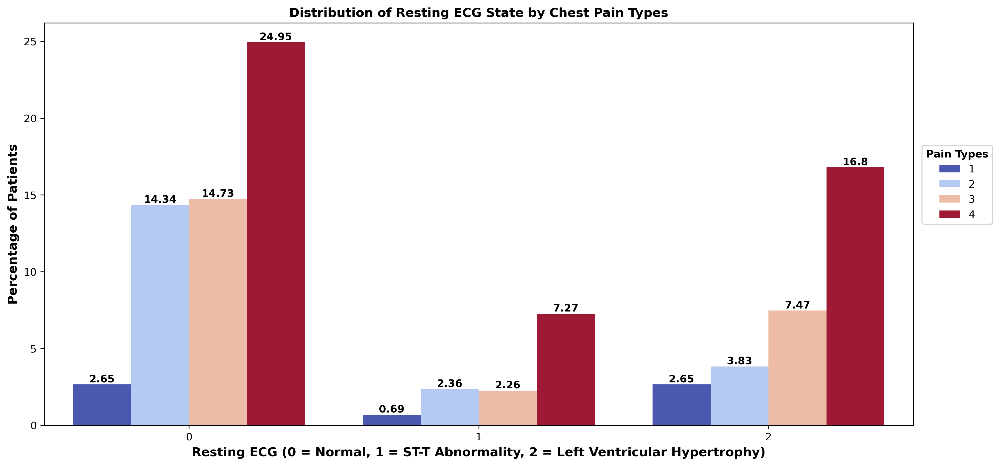

In [41]:
# Setting plot size
plt.figure(figsize = (15, 7))

# Checking what is the distribution of different resting ECG states in patients with varying types of chest pain
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'resting_ecg',
    hue = 'chest_pain_type',
    palette = 'coolwarm'
)

# Annotating the bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Resting ECG State by Chest Pain Types")
plt.xlabel("Resting ECG (0 = Normal, 1 = ST-T Abnormality, 2 = Left Ventricular Hypertrophy)")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Pain Types", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

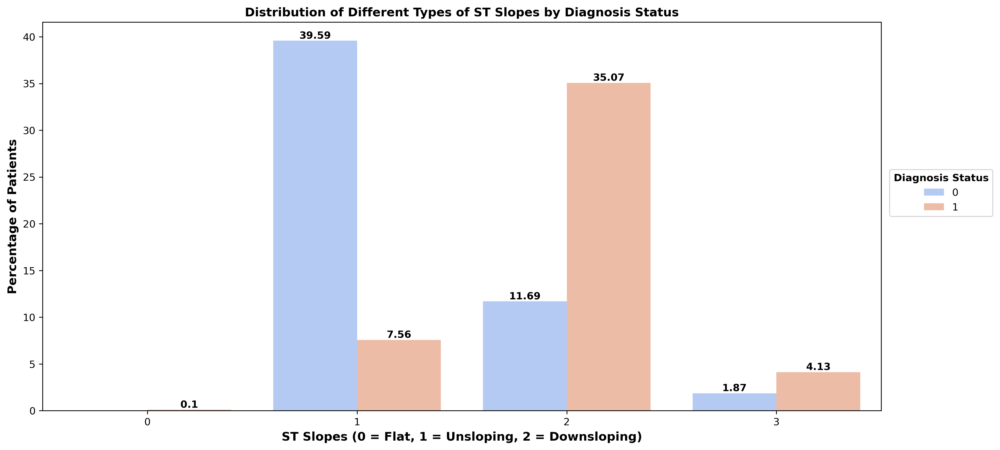

In [42]:
# Setting plot size
plt.figure(figsize = (15, 7))

# Checking what is the distribution of individuals with different types of ST slopes based on diagnosis status
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'st_slope',
    hue = 'target',
    palette = 'coolwarm'
)

# Annotating the bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Different Types of ST Slopes by Diagnosis Status")
plt.xlabel("ST Slopes (0 = Flat, 1 = Unsloping, 2 = Downsloping)")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

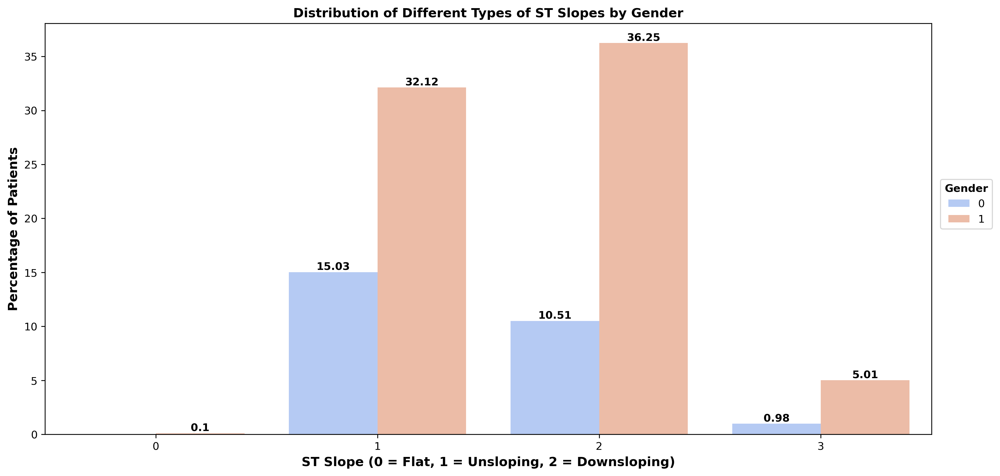

In [43]:
# Setting plot size
plt.figure(figsize = (15, 7))

# Checking what is the distribution of individuals with different types of ST slopes based on sex
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'st_slope',
    hue = 'sex',
    palette = 'coolwarm'
)

# Annotating the bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Different Types of ST Slopes by Gender")
plt.xlabel("ST Slope (0 = Flat, 1 = Unsloping, 2 = Downsloping)")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Gender", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

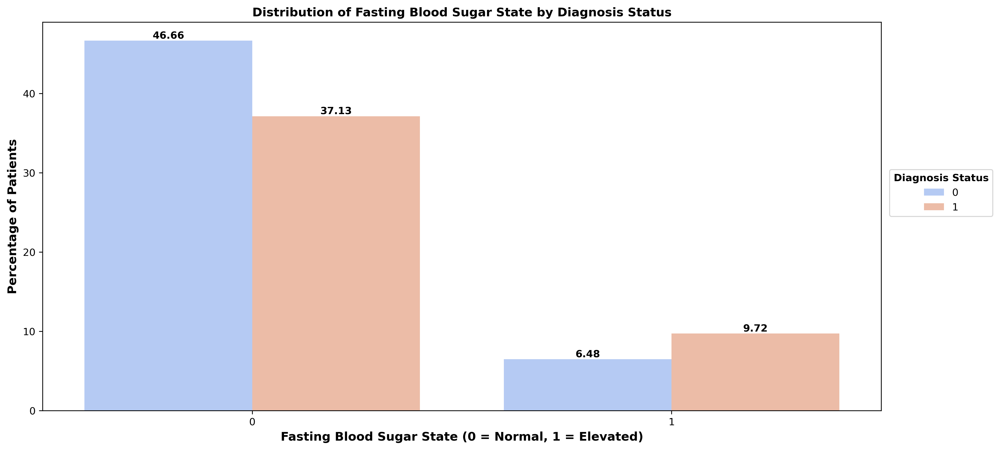

In [44]:
# Setting plot size
plt.figure(figsize = (15, 7))

# Checking What is the distribution of individuals' fasting blood sugar levels by diagnosis status
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'fasting_blood_sugar',
    hue = 'target',
    palette = 'coolwarm'
)

# Annotating the bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Fasting Blood Sugar State by Diagnosis Status")
plt.xlabel("Fasting Blood Sugar State (0 = Normal, 1 = Elevated)")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

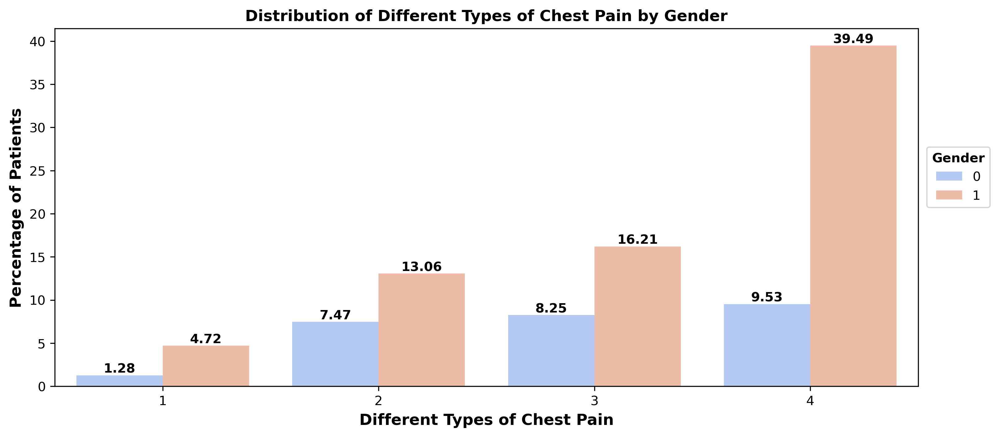

In [45]:
# Checking what percentage of patients experience different types of chest pain based on gender
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'chest_pain_type',
    hue = 'sex',
    palette = 'coolwarm'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Different Types of Chest Pain by Gender")
plt.xlabel("Different Types of Chest Pain")
plt.ylabel("Percentage of Patients")

# Setting the location of the legend
plt.legend(title = 'Gender', title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

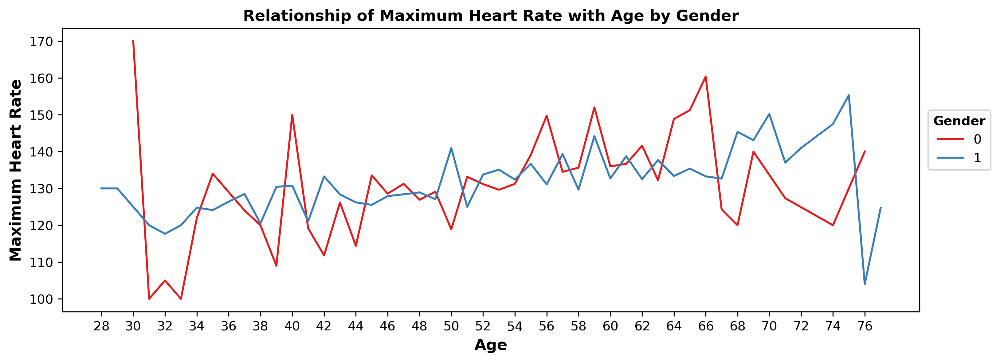

In [46]:
# Setting the plot size
plt.figure(figsize = (12, 4))

# Checking how does maximum heart rate change with age for males and females
sns.lineplot(
    data = df,
    x = 'age',
    y = 'resting_blood_pressure',
    hue = 'sex',
    palette = 'Set1',
    errorbar=None
)

# Setting title and labels of the plot
plt.title("Relationship of Maximum Heart Rate with Age by Gender")
plt.xlabel("Age")
plt.ylabel("Maximum Heart Rate")

# Changing xtick values
min_value = df['age'].min()
max_value = df['age'].max()
plt.xticks(range(min_value, max_value, 2))

# Setting the location of the legend
plt.legend(title = "Gender", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

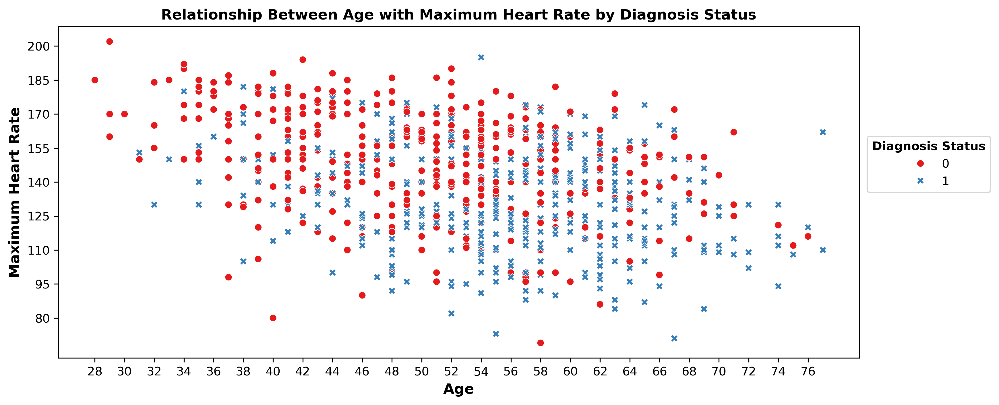

In [47]:
# Checking how does age relate to maximum heart rate based on the diagnosis outcome
sns.scatterplot(
    data = df,
    x = 'age',
    y = 'max_heart_rate',
    hue = 'target',
    palette = 'Set1',
    style = 'target'
)

# Adding title and labels to the plot
plt.title("Relationship Between Age with Maximum Heart Rate by Diagnosis Status")
plt.xlabel("Age")
plt.ylabel("Maximum Heart Rate")

# Changing the xticks and yticks values
plt.xticks(range(df['age'].min(), df['age'].max(), 2))
plt.yticks(range(80, 210, 15))

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

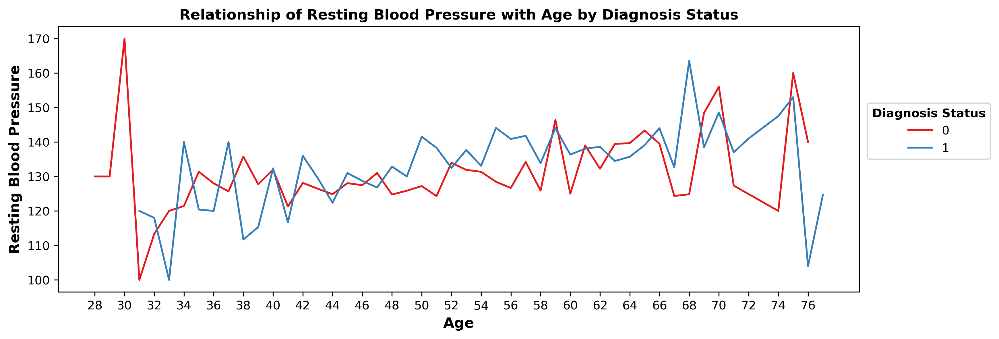

In [48]:
# Setting the plot size
plt.figure(figsize = (12, 4))

# Checking how does resting blood pressure change with age in individuals with and without heart disease
sns.lineplot(
    data = df,
    x = 'age',
    y = 'resting_blood_pressure',
    hue = 'target',
    palette = 'Set1',
    errorbar=None
)

# Setting title and labels of the plot
plt.title("Relationship of Resting Blood Pressure with Age by Diagnosis Status")
plt.xlabel("Age")
plt.ylabel("Resting Blood Pressure")

# Changing xtick values
min_value = df['age'].min()
max_value = df['age'].max()
plt.xticks(range(min_value, max_value, 2))

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

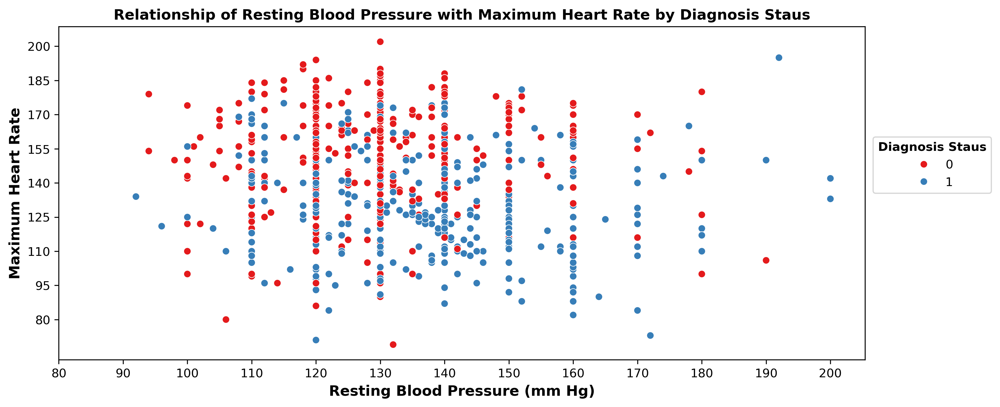

In [49]:
# Checking how resting blood pressure and maximum heart rate are related for individual with and without heart disease
sns.scatterplot(
    data = df,
    x = 'resting_blood_pressure',
    y = 'max_heart_rate',
    hue = 'target',
    palette = 'Set1'
)

# Adding title and labels to the plot
plt.title("Relationship of Resting Blood Pressure with Maximum Heart Rate by Diagnosis Staus")
plt.xlabel("Resting Blood Pressure (mm Hg)")
plt.ylabel("Maximum Heart Rate")

# Changing the xticks and yticks values
plt.xticks(range(80, 210, 10))
plt.yticks(range(80, 210, 15))

# Setting the location of the legend
plt.legend(title = "Diagnosis Staus", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

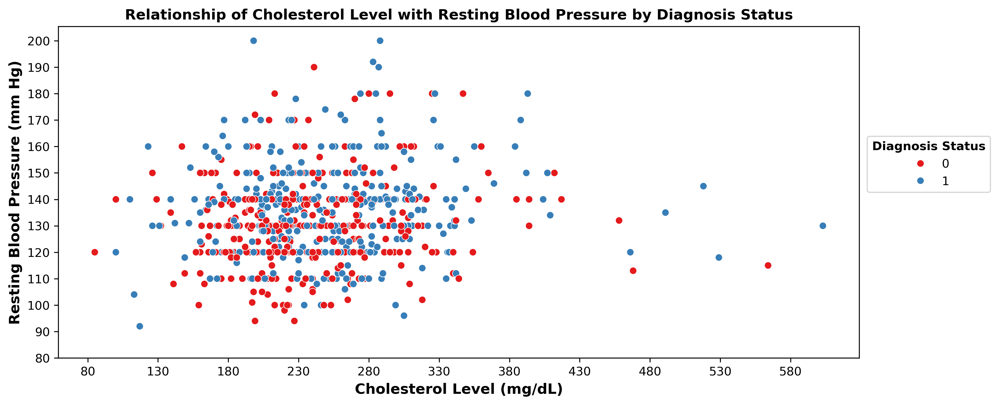

In [50]:
# Checking how cholesterol levels and resting blood pressure are related for individual with and without heart disease
sns.scatterplot(
    data = df,
    x = 'cholesterol',
    y = 'resting_blood_pressure',
    hue = 'target',
    palette = 'Set1'
)

# Adding title and labels to the plot
plt.title("Relationship of Cholesterol Level with Resting Blood Pressure by Diagnosis Status")
plt.xlabel("Cholesterol Level (mg/dL)")
plt.ylabel("Resting Blood Pressure (mm Hg)")

# Changing the xticks and yticks values
plt.xticks(range(80, 610, 50))
plt.yticks(range(80, 210, 10))

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

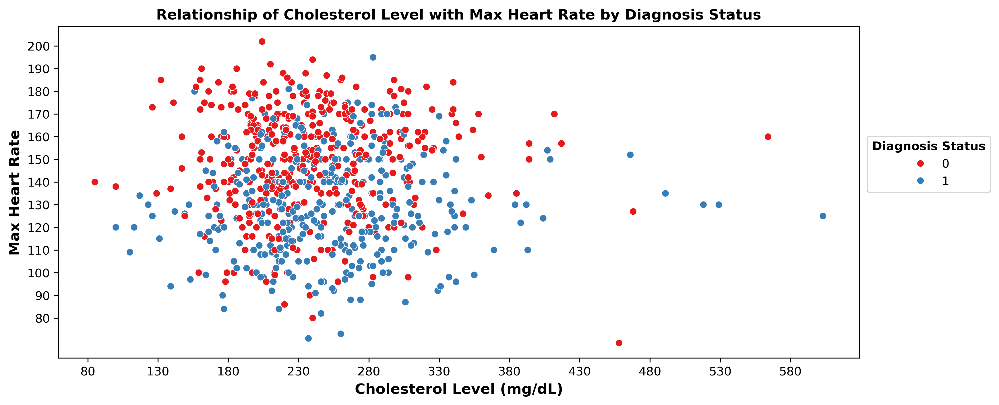

In [51]:
# Checking how cholesterol levels and max heart rate are related for individual with and without heart disease
sns.scatterplot(
    data = df,
    x = 'cholesterol',
    y = 'max_heart_rate',
    hue = 'target',
    palette = 'Set1'
)

# Adding title and labels to the plot
plt.title("Relationship of Cholesterol Level with Max Heart Rate by Diagnosis Status")
plt.xlabel("Cholesterol Level (mg/dL)")
plt.ylabel("Max Heart Rate")

# Changing the xticks and yticks values
plt.xticks(range(80, 610, 50))
plt.yticks(range(80, 210, 10))

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

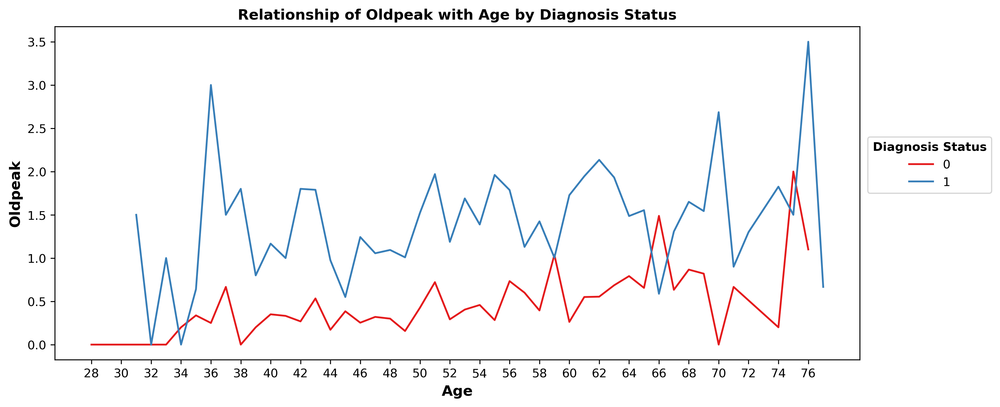

In [52]:
# Checking how does oldpeak changes with age in individuals with and without heart disease
sns.lineplot(
    data = df,
    x = 'age',
    y = 'oldpeak',
    hue = 'target',
    palette = 'Set1',
    errorbar = None
)

# Adding title and labels to the plot
plt.title("Relationship of Oldpeak with Age by Diagnosis Status")
plt.xlabel("Age")
plt.ylabel("Oldpeak")

# Changing the xticks and yticks values
plt.xticks(range(df['age'].min(), df['age'].max(), 2))

# Setting the location of the legend
plt.legend(title = "Diagnosis Status", title_fontproperties = {'weight':'bold'}, loc = (1.01, 0.5));

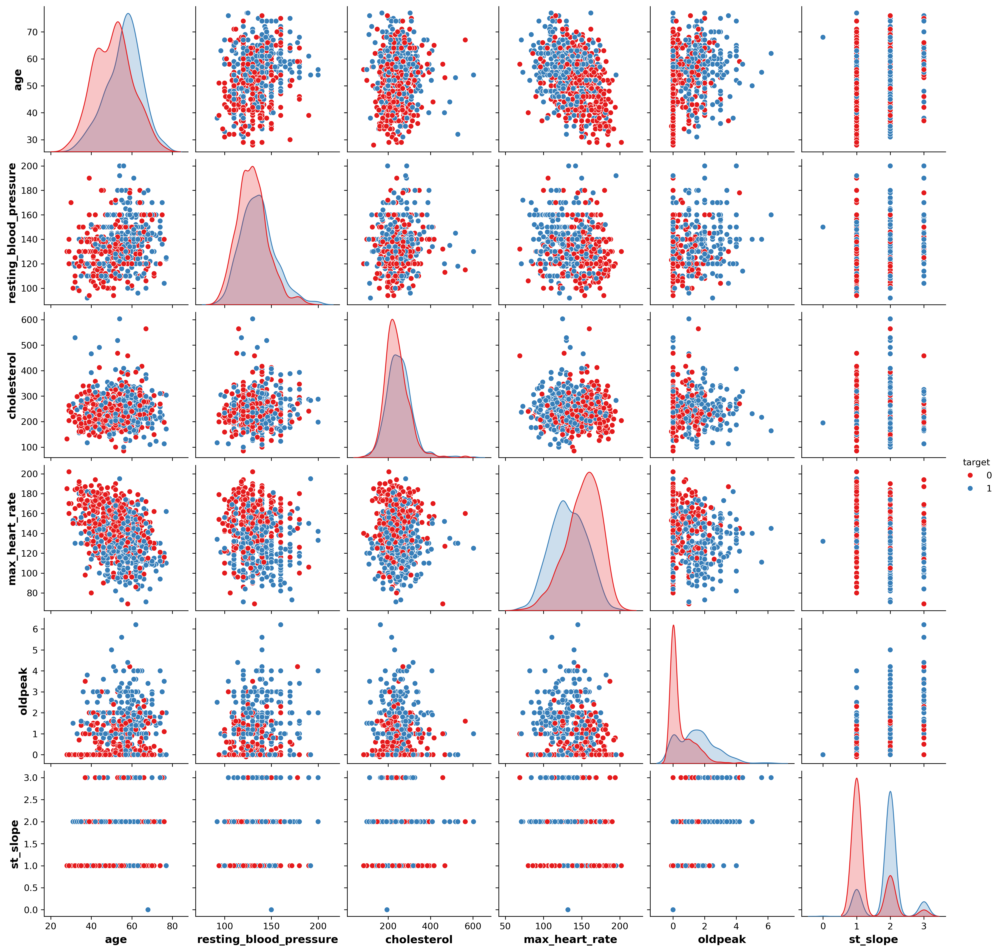

In [53]:
# Checking how age, cholesterol, blood pressure, etc. interact with each other in predicting heart disease
column_names = ['age', 'resting_blood_pressure', 'cholesterol', 'max_heart_rate', 'oldpeak', 'st_slope', 'target']
sns.pairplot(
    data = df[column_names],
    hue = 'target',
    palette = 'Set1'
);

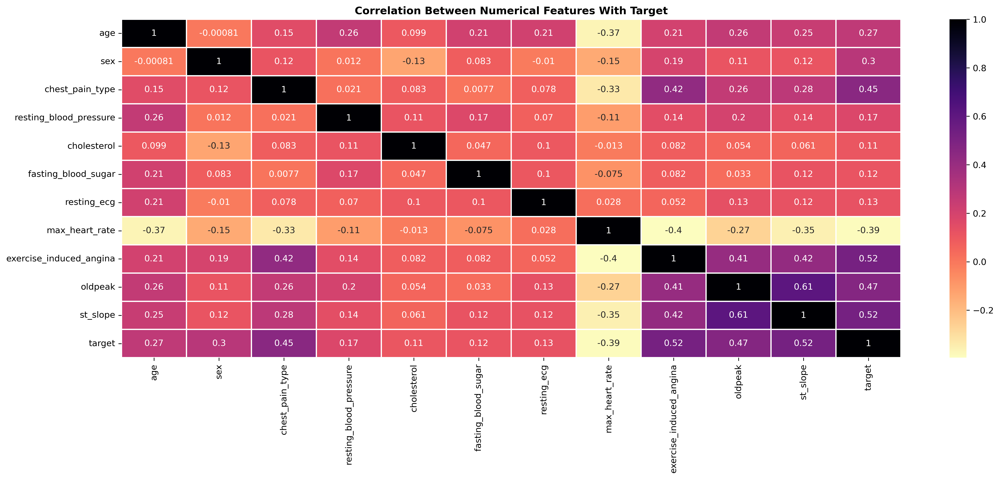

In [54]:
# Setting the plot size 
plt.figure(figsize = (20, 7))

# Checking correlation between all numerical variables with target
sns.heatmap(
    data = df.corr(numeric_only = True), 
    annot=True, 
    linecolor='white', 
    linewidths=1,
    cmap = 'magma_r'
)

# Adding title and labels to the plot
plt.title("Correlation Between Numerical Features With Target");

---

## **Feature Engineering**

#### **Resting Blood Pressure**

Higher resting blood pressure values generally correlate with an increased risk of heart disease and other cardiovascular conditions, particularly when blood pressure remains elevated over time. It is essential to manage high blood pressure through lifestyle modifications and, when necessary, medical treatment to reduce the risk of heart disease and related complications.

- **Normal Blood Pressure:** A resting blood pressure below 120/80 mmHg is considered normal and indicates no immediate risk of cardiovascular disease.
  
- **Elevated Blood Pressure (121-130 mm Hg):** Blood pressure within this range is higher than normal but not yet classified as hypertension. If left unmanaged, it can increase the risk of developing hypertension and heart disease over time.
  
- **Stage 1 Hypertension (131-140 mm Hg):** This range marks the beginning of hypertension, which significantly raises the risk of cardiovascular disease. It typically requires lifestyle changes and may require medication to control blood pressure.
  
- **Stage 2 Hypertension (141 mm Hg or higher):** At this stage, blood pressure is significantly elevated, indicating a high risk of heart disease and other complications. Medical intervention, including medication, is usually necessary to reduce blood pressure and prevent further health risks.
  
- **Hypertensive Crisis (181 mm Hg or higher):** This is considered a medical emergency, requiring immediate attention to prevent severe health outcomes, such as heart attack or stroke.

In [55]:
# Bins and labels for resting_bp_binned column
resting_bp_bins = [80, 120, 130, 140, 180, 200]
resting_bp_labels = ["normal", "elevated", "hypertension-stage-1", "hypertension-stage-2", "hypertensive"]

In [56]:
# Creating a new column: 'resting_bp_binned'
df['resting_bp_binned'] = pd.cut(df['resting_blood_pressure'], bins = resting_bp_bins, labels = resting_bp_labels)
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target,resting_bp_binned
0,40,1,2,140,289,0,0,172,0,0.0,1,0,hypertension-stage-1
1,49,0,3,160,180,0,0,156,0,1.0,2,1,hypertension-stage-2
2,37,1,2,130,283,0,1,98,0,0.0,1,0,elevated
3,48,0,4,138,214,0,0,108,1,1.5,2,1,hypertension-stage-1
4,54,1,3,150,195,0,0,122,0,0.0,1,0,hypertension-stage-2


#### **Cholesterol Level**

- Cholesterol levels are typically measured in milligrams per deciliter (mg/dL) of blood.

- Maintaining balanced cholesterol levels is essential for overall heart health.

- **Normal cholesterol levels**, particularly low LDL (low-density lipoprotein, often referred to as "bad" cholesterol) and high HDL (high-density lipoprotein, or "good" cholesterol), are protective against cardiovascular disease. However, **high cholesterol levels**, especially elevated LDL levels, significantly increase the risk of heart attacks, strokes, and other heart-related complications.

- **Various factors can influence cholesterol levels, including:**
  - Diet
  - Physical Activity
  - Body Weight
  - Medical Conditions
  - Smoking
  - Alcohol Consumption
  - Medications
  - Stress

- The following is a common classification used by healthcare professionals for total cholesterol levels:
  - **Normal:** Cholesterol levels below 200 mg/dL are generally considered desirable for most individuals.
  - **Elevated:** Cholesterol levels between 200 and 239 mg/dL are considered "borderline high" or "elevated."
  - **At-Risk:** Cholesterol levels between 240 and 299 mg/dL are high and indicate an increased risk for cardiovascular disease.
  - **Dangerous:** Cholesterol levels above 300 mg/dL are classified as very high or dangerous and require immediate medical attention.


In [57]:
# Bins and labels for cholesterol_binned
cholesterol_binned = [80, 200, 240, 300, 610]
cholesterol_labels = ["normal", "elevated", "at-risk", "dangerous"]

In [58]:
# Creating a new column: 'cholesterol_binned'
df['cholesterol_binned'] = pd.cut(df['cholesterol'], bins = cholesterol_binned, labels = cholesterol_labels)
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target,resting_bp_binned,cholesterol_binned
0,40,1,2,140,289,0,0,172,0,0.0,1,0,hypertension-stage-1,at-risk
1,49,0,3,160,180,0,0,156,0,1.0,2,1,hypertension-stage-2,normal
2,37,1,2,130,283,0,1,98,0,0.0,1,0,elevated,at-risk
3,48,0,4,138,214,0,0,108,1,1.5,2,1,hypertension-stage-1,elevated
4,54,1,3,150,195,0,0,122,0,0.0,1,0,hypertension-stage-2,normal


#### **Maximum Heart Rate**

- The heart rate is commonly measured in beats per minute (BPM).

- For a healthy individual, the typical resting heart rate ranges from **60 to 100 BPM**. This is considered normal for most adults at rest.

- A heart rate exceeding **100 BPM** (known as **tachycardia**) can be concerning, especially if accompanied by symptoms like shortness of breath or chest pain. This may indicate an underlying health issue that requires attention.

- Conversely, a heart rate below **60 BPM** (known as **bradycardia**) may be abnormal in individuals who are not highly trained athletes, and it may also signal a potential health concern depending on the context.

- Several factors can influence heart rate, including:
  - **Cholesterol levels**: Elevated cholesterol can lead to heart disease, which in turn can affect heart rate.
  - **Age**: As a person ages, their maximum heart rate typically decreases.
  - **Cardiovascular conditions**: People with heart disease may experience abnormal heart rate patterns.
  - **Pain or stress**: Physical discomfort or emotional stress can temporarily elevate heart rate.

- The **maximum heart rate (MHR)** is often estimated by the formula **220 minus age**. This provides a rough estimate of the highest heart rate a person should aim for during intense exercise. For example, a 40-year-old would have an estimated maximum heart rate of **180 BPM**.

In [59]:
# Creating a new column: 'below_expected_max_heart_rate'
df['below_expected_max_heart_rate'] = df['max_heart_rate'] < (220 - df['age'])
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target,resting_bp_binned,cholesterol_binned,below_expected_max_heart_rate
0,40,1,2,140,289,0,0,172,0,0.0,1,0,hypertension-stage-1,at-risk,True
1,49,0,3,160,180,0,0,156,0,1.0,2,1,hypertension-stage-2,normal,True
2,37,1,2,130,283,0,1,98,0,0.0,1,0,elevated,at-risk,True
3,48,0,4,138,214,0,0,108,1,1.5,2,1,hypertension-stage-1,elevated,True
4,54,1,3,150,195,0,0,122,0,0.0,1,0,hypertension-stage-2,normal,True


#### **Cholesterol to Age Ratio**

- The cholesterol level in relation to a person's age can provide more meaningful context than simply considering cholesterol levels in isolation.

- As individuals age, cholesterol levels tend to increase naturally. Therefore, normalizing cholesterol values relative to age can help identify whether someone has unusually high or low cholesterol levels compared to others in their age group.

- This **cholesterol-to-age ratio** is particularly valuable for identifying individuals who may be at a higher risk for heart disease, as it highlights abnormal cholesterol patterns relative to age, which can be more predictive than just considering the cholesterol level alone.

- By including the **cholesterol-to-age ratio**, we can better capture how cholesterol interacts with age in terms of heart disease risk. This could potentially improve the model's ability to identify individuals at risk, making it a more robust tool for heart disease prediction.

In [60]:
# Calculating the ratio between the cholesterol levela and age of individuals
df['cholesterol_age_ratio'] = df['cholesterol'] / df['age']
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target,resting_bp_binned,cholesterol_binned,below_expected_max_heart_rate,cholesterol_age_ratio
0,40,1,2,140,289,0,0,172,0,0.0,1,0,hypertension-stage-1,at-risk,True,7.225000
1,49,0,3,160,180,0,0,156,0,1.0,2,1,hypertension-stage-2,normal,True,3.673469
2,37,1,2,130,283,0,1,98,0,0.0,1,0,elevated,at-risk,True,7.648649
3,48,0,4,138,214,0,0,108,1,1.5,2,1,hypertension-stage-1,elevated,True,4.458333
4,54,1,3,150,195,0,0,122,0,0.0,1,0,hypertension-stage-2,normal,True,3.611111


#### **Difference Between Resting BP and Cholesterol Level**

- This feature calculates the difference between two key cardiovascular metrics:
    - **Resting Blood Pressure (BP)**
    - **Cholesterol Level**

- Analyzing the difference between these values may reveal specific imbalances or unusual patterns between blood pressure and cholesterol levels, which could be crucial for identifying heart disease.

- This feature could be particularly useful for detecting cases where **high cholesterol** exists without corresponding **high blood pressure** (or vice versa). Such discrepancies may point to underlying health conditions that are not immediately obvious from examining either metric alone.

- By including this difference, the model can capture relationships that may otherwise be missed, potentially improving its predictive accuracy for heart disease risk.

In [61]:
# Calculating the difference between resting bp and cholesterol level of individuals
df['resting_bp_cholesterol_diff'] = df['resting_blood_pressure'] - df['cholesterol']
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target,resting_bp_binned,cholesterol_binned,below_expected_max_heart_rate,cholesterol_age_ratio,resting_bp_cholesterol_diff
0,40,1,2,140,289,0,0,172,0,0.0,1,0,hypertension-stage-1,at-risk,True,7.225000,-149
1,49,0,3,160,180,0,0,156,0,1.0,2,1,hypertension-stage-2,normal,True,3.673469,-20
2,37,1,2,130,283,0,1,98,0,0.0,1,0,elevated,at-risk,True,7.648649,-153
3,48,0,4,138,214,0,0,108,1,1.5,2,1,hypertension-stage-1,elevated,True,4.458333,-76
4,54,1,3,150,195,0,0,122,0,0.0,1,0,hypertension-stage-2,normal,True,3.611111,-45


#### **Maximum Heart Rate to Age Ratio**

- The ratio of maximum heart rate (MHR) to age can provide valuable insight into an individual’s cardiovascular fitness and stamina.

- Older individuals who still achieve high maximum heart rates may have better cardiovascular health and fitness compared to those who attain lower heart rates for their age, suggesting better overall heart function.

- This feature can highlight whether a person’s maximum heart rate is typical for their age group, potentially identifying individuals who may be at higher risk for cardiovascular problems due to suboptimal cardiovascular fitness.

- By including the **maximum heart rate to age ratio**, the model can offer a more normalized and relative measure of heart rate and fitness, which could provide a clearer indication of heart disease risk and improve the accuracy of predictions.

In [62]:
# Calculating the ratio of max heart rate and age of individuals
df['max_hr_age_ratio'] = df['max_heart_rate'] / df['age']
df.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_induced_angina,oldpeak,st_slope,target,resting_bp_binned,cholesterol_binned,below_expected_max_heart_rate,cholesterol_age_ratio,resting_bp_cholesterol_diff,max_hr_age_ratio
0,40,1,2,140,289,0,0,172,0,0.0,1,0,hypertension-stage-1,at-risk,True,7.225000,-149,4.300000
1,49,0,3,160,180,0,0,156,0,1.0,2,1,hypertension-stage-2,normal,True,3.673469,-20,3.183673
2,37,1,2,130,283,0,1,98,0,0.0,1,0,elevated,at-risk,True,7.648649,-153,2.648649
3,48,0,4,138,214,0,0,108,1,1.5,2,1,hypertension-stage-1,elevated,True,4.458333,-76,2.250000
4,54,1,3,150,195,0,0,122,0,0.0,1,0,hypertension-stage-2,normal,True,3.611111,-45,2.259259


---

## **Predictive Modelling**

In [63]:
# Importing required modules
from scipy.stats import zscore
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder, OneHotEncoder, FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay
from xgboost import XGBClassifier

In [64]:
# List of columns that needs to be excluded from the transformation
cols_to_exclude = ['sex', 'chest_pain_type', 'fasting_blood_sugar', 'resting_ecg', 'exercise_induced_angina', 'st_slope']

In [65]:
# Getting the index of numerical columns
numeric_cols = df.select_dtypes(include=np.number).columns
numeric_cols_idx = df.columns.get_indexer([col for col in numeric_cols if col not in cols_to_exclude])

# Getting the index of categorical columns
categorical_cols = df.select_dtypes(exclude=np.number).columns
categorical_cols_idx = df.columns.get_indexer([col for col in categorical_cols if col not in cols_to_exclude])

In [66]:
# Creating a column transformer for transforming numerical and categorical columns
preprocessor = ColumnTransformer(
    transformers=[
        ('OrdinalEncoder', OrdinalEncoder(), categorical_cols_idx),
        ('MinMaxScaler', MinMaxScaler(), numeric_cols_idx)
    ],
    remainder="passthrough"
)

In [67]:
# Function to remove outliers based on Z-scores
def remove_outliers(X):
    """
    This function will remove outliers from the dataset using the absolute value of Z-score.

    Parameters:
    - X: The DataFrame object

    Returns: DataFrame without the outliers, if any.
    """

    # Calculating the Z-scores 
    z_scores = np.abs(zscore(X))
    
    # Filtering rows with Z-scores less than 3 for all features
    return X[(z_scores < 3).all(axis=1)]
    

In [68]:
# Creating a pipeline to process the data
process_data = Pipeline(
    steps = [
        ('preprocessor', preprocessor),  
        ('RemoveOutliers', FunctionTransformer(remove_outliers, validate=True))
    ]
)

In [69]:
# Processing the DataFrame
df_processed = process_data.fit_transform(df)

In [70]:
# List of encoded column names
encoded_cols = preprocessor.transformers_[0][1].get_feature_names_out().tolist() + preprocessor.transformers_[1][1].get_feature_names_out().tolist()
encoded_cols.extend(cols_to_exclude)

In [71]:
# Creating a dataframe from the processed data
df_processed = pd.DataFrame(data = df_processed, columns = encoded_cols)
df_processed

,resting_bp_binned,cholesterol_binned,below_expected_max_heart_rate,age,resting_blood_pressure,cholesterol,max_heart_rate,oldpeak,target,cholesterol_age_ratio,resting_bp_cholesterol_diff,max_hr_age_ratio,sex,chest_pain_type,fasting_blood_sugar,resting_ecg,exercise_induced_angina,st_slope
0,1.0,0.0,1.0,0.244898,0.444444,0.393822,0.774436,0.015873,0.0,0.381415,0.631579,0.548662,1.0,2.0,0.0,0.0,0.0,1.0
1,2.0,3.0,1.0,0.428571,0.629630,0.183398,0.654135,0.174603,1.0,0.145345,0.883041,0.359641,0.0,3.0,0.0,0.0,0.0,2.0
2,0.0,0.0,1.0,0.183673,0.351852,0.382239,0.218045,0.015873,0.0,0.409575,0.623782,0.269048,1.0,2.0,0.0,1.0,0.0,1.0
3,1.0,2.0,1.0,0.408163,0.425926,0.249035,0.293233,0.253968,1.0,0.197515,0.773879,0.201547,0.0,4.0,0.0,0.0,1.0,2.0
4,2.0,3.0,1.0,0.530612,0.537037,0.212355,0.398496,0.015873,0.0,0.141200,0.834308,0.203115,1.0,3.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,4.0,0.0,1.0,0.346939,0.166667,0.345560,0.473684,0.206349,1.0,0.291126,0.621832,0.317252,1.0,1.0,0.0,0.0,0.0,2.0
978,2.0,3.0,1.0,0.816327,0.481481,0.208494,0.541353,0.555556,1.0,0.089827,0.826511,0.171666,1.0,4.0,1.0,0.0,0.0,2.0
979,0.0,3.0,1.0,0.591837,0.351852,0.088803,0.345865,0.206349,1.0,0.053934,0.920078,0.162186,1.0,4.0,0.0,0.0,1.0,2.0
980,0.0,2.0,0.0,0.591837,0.351852,0.291506,0.789474,0.015873,1.0,0.176378,0.715400,0.337452,0.0,2.0,0.0,2.0,0.0,2.0


In [72]:
# Checking if we have any null values in the dataframe
df_processed.isnull().sum()

resting_bp_binned                0
cholesterol_binned               0
below_expected_max_heart_rate    0
age                              0
resting_blood_pressure           0
cholesterol                      0
max_heart_rate                   0
oldpeak                          0
target                           0
cholesterol_age_ratio            0
resting_bp_cholesterol_diff      0
max_hr_age_ratio                 0
sex                              0
chest_pain_type                  0
fasting_blood_sugar              0
resting_ecg                      0
exercise_induced_angina          0
st_slope                         0
dtype: int64

In [73]:
# Separating the data into X and y
X = df_processed.drop('target', axis = 1)
y = df_processed['target']

In [74]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
(X_train.shape, y_train.shape), (X_test.shape, y_test.shape)

(((687, 17), (687,)), ((295, 17), (295,)))

In [75]:
# Dictionary of model to be tested
models = {
    "LogisticRegression" : LogisticRegression(random_state=101),
    "SGDClassifier" : SGDClassifier(loss = "log_loss", random_state=101),
    "DecisionTreeClassifier" : DecisionTreeClassifier(random_state=101),
    "SVC" : SVC(probability=True, random_state=101),
    "KNeighborsClassifier" : KNeighborsClassifier(),
    "RandomForestClassifier" : RandomForestClassifier(random_state=101),
    "AdaBoostClassifier" : AdaBoostClassifier(random_state=101),
    "GradientBoostingClassifier" : GradientBoostingClassifier(random_state=101),
    "XGBClassifier" : XGBClassifier(random_state = 101)
}

In [76]:
# Suppressing warning
from warnings import filterwarnings
filterwarnings('ignore')

In [77]:
# Initialize a dictionary to store model performances
model_performance = {}

# Loop through each model, train, and evaluate performance
for model_name, model in models.items():

    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    
    # Store the performance metrics for each model
    model_performance[model_name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'ROC AUC': roc_auc
    }

In [78]:
# Checking the performance of different models
model_performance_df = pd.DataFrame(model_performance)
model_performance_df

,LogisticRegression,SGDClassifier,DecisionTreeClassifier,SVC,KNeighborsClassifier,RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,XGBClassifier
Accuracy,0.877966,0.772881,0.891525,0.867797,0.847458,0.928814,0.847458,0.932203,0.928814
Precision,0.868217,0.670213,0.909091,0.843284,0.794521,0.910448,0.816176,0.905109,0.898551
Recall,0.854962,0.961832,0.839695,0.862595,0.885496,0.931298,0.847328,0.946565,0.946565
F1-Score,0.861538,0.789969,0.873016,0.852830,0.837545,0.920755,0.831461,0.925373,0.921933
ROC AUC,0.938280,0.936930,0.886311,0.946379,0.899414,0.969838,0.936883,0.961879,0.960249


---

## **Final Model Using StackingClassifier**

In [79]:
# Defining base learners for stacking
base_learners = [
    ("DecisionTreeClassifier", DecisionTreeClassifier(max_depth=4, random_state=101)),
    ("RandomForestClassifier", RandomForestClassifier(n_estimators=100, max_depth=4, oob_score=True, random_state=101)),
    ("XGBClassifier", XGBClassifier(n_estimators=100, max_depth = 4, learning_rate = 0.3, random_state=101)),
    ("GradientBoostingClassifier", GradientBoostingClassifier(n_estimators=100, max_depth=4, learning_rate=0.3, random_state=101))
]

In [80]:
# Defining the meta model for final prediction
meta_model = LogisticRegression(random_state=101)

In [81]:
# Create the stacking classifier
stacked_model = StackingClassifier(estimators=base_learners, final_estimator=meta_model)
stacked_model.fit(X_train, y_train)

StackingClassifier(estimators=[('DecisionTreeClassifier',
                                DecisionTreeClassifier(max_depth=4,
                                                       random_state=101)),
                               ('RandomForestClassifier',
                                RandomForestClassifier(max_depth=4,
                                                       oob_score=True,
                                                       random_state=101)),
                               ('XGBClassifier',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              de...
                                              max_delta_step=None, max_depth=4,
                                              max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=100, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=101, ...)),
                               ('GradientBoostingClassifier',
                                GradientBoostingClassifier(learning_rate=0.3,
                                                           max_depth=4,
                                                           random_state=101))],
                   final_estimator=LogisticRegression(random_state=101))

In [82]:
# Make predictions
y_pred = stacked_model.predict(X_test)

In [83]:
# Evaluating the model
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(f"Precision: {precision_score(y_test, y_pred)}")
print(f"Recall: {recall_score(y_test, y_pred)}")
print(f"F1-Score: {f1_score(y_test, y_pred)}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])}")

Accuracy: 0.9254237288135593
Precision: 0.8978102189781022
Recall: 0.9389312977099237
F1-Score: 0.917910447761194
ROC-AUC Score: 0.9602494879910631
